## Imports and Libraries Used

In [381]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
#import missingno as msno 
from sklearn import clone
from copy import deepcopy
import scipy.stats as stats
from itertools import combinations
import math

from sklearn.base import BaseEstimator, RegressorMixin
from sklearn.utils import check_array
from scikeras.wrappers import KerasRegressor 
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from category_encoders import TargetEncoder
from sklearn.feature_selection import SelectKBest, RFE
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split,GridSearchCV, RandomizedSearchCV, KFold
from scipy.stats import uniform, randint
from sklearn.pipeline import Pipeline
from sklearn.model_selection import cross_val_score,KFold
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error,root_mean_squared_error
from sklearn.impute import SimpleImputer
from sklearn.linear_model import HuberRegressor

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier,  GradientBoostingRegressor, StackingRegressor, AdaBoostRegressor
from sklearn.linear_model import LinearRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor,export_text
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor
from sklearn.cluster import KMeans

import tensorflow as tf
from tensorflow import keras
from keras import layers, Model

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense,Input,Dropout
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

In [382]:
insurance_data = pd.read_csv('insurance_claim_data.csv')

In [383]:
## Convert to Datetime format for better analysis
insurance_data['Claim Date'] = pd.to_datetime(insurance_data['Claim Date'])
insurance_data['Accident Date'] = pd.to_datetime(insurance_data['Accident Date'])

## Feature Name Normalization

In [384]:
# print all the column name
insurance_data.columns

Index(['SettlementValue', 'AccidentType', 'Injury_Prognosis',
       'SpecialHealthExpenses', 'SpecialReduction', 'SpecialOverage',
       'GeneralRest', 'SpecialAdditionalInjury', 'SpecialEarningsLoss',
       'SpecialUsageLoss', 'SpecialMedications', 'SpecialAssetDamage',
       'SpecialRehabilitation', 'SpecialFixes', 'GeneralFixed',
       'GeneralUplift', 'SpecialLoanerVehicle', 'SpecialTripCosts',
       'SpecialJourneyExpenses', 'SpecialTherapy', 'Exceptional_Circumstances',
       'Minor_Psychological_Injury', 'Dominant injury', 'Whiplash',
       'Vehicle Type', 'Weather Conditions', 'Accident Date', 'Claim Date',
       'Vehicle Age', 'Driver Age', 'Number of Passengers',
       'Accident Description', 'Injury Description', 'Police Report Filed',
       'Witness Present', 'Gender'],
      dtype='object')

In [385]:
def format_column_names(columns):

    formatted_columns = []
    
    for column in columns:
        # Handle columns with spaces
        if ' ' in column:
            words = column.split(' ')
            words = [word.capitalize() for word in words]
            formatted = '_'.join(words)
            formatted_columns.append(formatted)
            continue
            
        # Handle columns that already have underscores
        if '_' in column:
            words = column.split('_')
            words = [word.capitalize() for word in words]
            formatted = '_'.join(words)
            formatted_columns.append(formatted)
            continue
            
        # Process CamelCase columns (e.g., 'SettlementValue')
        result = column[0]  # Keep the first character
        for i in range(1, len(column)):
            # If current character is uppercase and previous is lowercase
            # insert an underscore (detects word boundaries in CamelCase)
            if column[i].isupper() and column[i-1].islower():
                result += '_' + column[i]
            else:
                result += column[i]
        
        # Capitalize each word after splitting by underscore
        words = result.split('_')
        words = [word.capitalize() for word in words]
        formatted = '_'.join(words)
        
        formatted_columns.append(formatted)
    
    return formatted_columns

# Define your column names (sample from your data)
columns = ['SettlementValue', 'AccidentType', 'Injury_Prognosis',
       'SpecialHealthExpenses', 'SpecialReduction', 'SpecialOverage',
       'GeneralRest', 'SpecialAdditionalInjury', 'SpecialEarningsLoss',
       'SpecialUsageLoss', 'SpecialMedications', 'SpecialAssetDamage',
       'SpecialRehabilitation', 'SpecialFixes', 'GeneralFixed',
       'GeneralUplift', 'SpecialLoanerVehicle', 'SpecialTripCosts',
       'SpecialJourneyExpenses', 'SpecialTherapy', 'Exceptional_Circumstances',
       'Minor_Psychological_Injury', 'Dominant injury', 'Whiplash',
       'Vehicle Type', 'Weather Conditions', 'Accident Date', 'Claim Date',
       'Vehicle Age', 'Driver Age', 'Number of Passengers',
       'Accident Description', 'Injury Description', 'Police Report Filed',
       'Witness Present', 'Gender']

# Apply the function to normalize column names
formatted_columns = format_column_names(columns)

# Print before and after comparison for verification
print("Original vs Normalized column names:")
for original, formatted in zip(columns, formatted_columns):
    print(f"{original:35} -> {formatted}")

# Update your DataFrame with the normalized column names
insurance_data.columns = formatted_columns

Original vs Normalized column names:
SettlementValue                     -> Settlement_Value
AccidentType                        -> Accident_Type
Injury_Prognosis                    -> Injury_Prognosis
SpecialHealthExpenses               -> Special_Health_Expenses
SpecialReduction                    -> Special_Reduction
SpecialOverage                      -> Special_Overage
GeneralRest                         -> General_Rest
SpecialAdditionalInjury             -> Special_Additional_Injury
SpecialEarningsLoss                 -> Special_Earnings_Loss
SpecialUsageLoss                    -> Special_Usage_Loss
SpecialMedications                  -> Special_Medications
SpecialAssetDamage                  -> Special_Asset_Damage
SpecialRehabilitation               -> Special_Rehabilitation
SpecialFixes                        -> Special_Fixes
GeneralFixed                        -> General_Fixed
GeneralUplift                       -> General_Uplift
SpecialLoanerVehicle                -> Special

## Data Cleaning and Preprocessing 

In [386]:
## Removing Special Reduction Feature (Brings No Value)
insurance_data.drop('Special_Reduction', axis=1, inplace=True)

In [387]:
## Remove Instances Where SettlementValue is 0
# Remove rows where SettlementValue is null or 0
insurance_data = insurance_data[insurance_data['Settlement_Value'].notna()]
insurance_data = insurance_data[insurance_data['Settlement_Value'] > 0]
insurance_data.reset_index(drop=True, inplace=True)

In [388]:
## Remove Outliers (Instances where 5 features have Null values)
## 5 Is Appropriate as we still have 96.4% of the data left
## We can impute up to 10% without losing too much information
insurance_data = insurance_data[insurance_data.isnull().sum(axis=1) < 5]
insurance_data.reset_index(drop=True, inplace=True)

## Feature Engineering 

In [389]:
# convert datetime columns into numerical values that the model can process
insurance_data['Days_Between_Accident_And_Claim'] = (insurance_data['Claim_Date'] - insurance_data['Accident_Date']).dt.days

In [390]:
# drop the datetime columns
insurance_data.drop(['Accident_Date', 'Claim_Date'], axis=1, inplace=True)

In [391]:
# Truncate and extract the numbers from Injury_Prognosis to form a float instead of object
insurance_data["Injury_Prognosis"] = insurance_data["Injury_Prognosis"].str.extract("(\d+)").astype(float)

<>:2: SyntaxWarning: invalid escape sequence '\d'
<>:2: SyntaxWarning: invalid escape sequence '\d'
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_4164\3991573653.py:2: SyntaxWarning: invalid escape sequence '\d'
  insurance_data["Injury_Prognosis"] = insurance_data["Injury_Prognosis"].str.extract("(\d+)").astype(float)


## Train-Test Split


In [392]:
## We take this approach to prevent data leakage to the model we will split then perform Preprocessing 
X_train, X_test, y_train, y_test = train_test_split(insurance_data.drop(columns=['Settlement_Value']), insurance_data['Settlement_Value'], test_size=0.2, random_state=42)

In [393]:
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print(f"Shape of y_train: {y_train.shape}")
print(f"Shape of y_test: {y_test.shape}")

Shape of X_train: (3812, 33)
Shape of X_test: (954, 33)
Shape of y_train: (3812,)
Shape of y_test: (954,)


## Feature Preprocessing (Encoding, Scaling and Imputation)

In [394]:
label_encoding_cols = ['Exceptional_Circumstances', 'Minor_Psychological_Injury', 'Whiplash', 'Police_Report_Filed', 'Witness_Present']
onehot_encoding_cols = ['Gender', 'Vehicle_Type', 'Weather_Conditions']
target_encoding_cols = ['Accident_Type', 'Accident_Description', 'Injury_Description', 'Dominant_Injury']

numerical_cols = [
    'Injury_Prognosis', 
    'Special_Health_Expenses', 
    'Special_Overage', 
    'General_Rest', 
    'Special_Additional_Injury', 
    'Special_Earnings_Loss', 
    'Special_Usage_Loss', 
    'Special_Medications', 
    'Special_Asset_Damage', 
    'Special_Rehabilitation', 
    'Special_Fixes', 
    'General_Fixed', 
    'General_Uplift', 
    'Special_Loaner_Vehicle', 
    'Special_Trip_Costs', 
    'Special_Journey_Expenses', 
    'Special_Therapy', 
    'Vehicle_Age', 
    'Driver_Age', 
    'Number_Of_Passengers', 
    'Days_Between_Accident_And_Claim'
]

categorical_cols = label_encoding_cols + onehot_encoding_cols + target_encoding_cols

### Imputation

In [395]:
# display the maximum number of columns
pd.set_option('display.max_columns', None)

In [396]:
numerical_imputer = SimpleImputer(strategy='mean')

X_train[numerical_cols] = numerical_imputer.fit_transform(X_train[numerical_cols])
X_test[numerical_cols] = numerical_imputer.transform(X_test[numerical_cols])

In [397]:
## Impute the Categorical Features with the Mode (Ie most fequent value)
categorical_imputer = SimpleImputer(strategy='most_frequent')

X_train[categorical_cols] = categorical_imputer.fit_transform(X_train[categorical_cols])
X_test[categorical_cols] = categorical_imputer.transform(X_test[categorical_cols])

In [497]:
# check the missing values in the X_train_imputed and X_test_imputed
print("Missing values in X_train_imputed:")
print(X_train.isnull().sum())
print("\nMissing values in X_test_imputed:")
print(X_test.isnull().sum())

Missing values in X_train_imputed:
Accident_Type                      0
Injury_Prognosis                   0
Special_Health_Expenses            0
Special_Overage                    0
General_Rest                       0
Special_Additional_Injury          0
Special_Earnings_Loss              0
Special_Usage_Loss                 0
Special_Medications                0
Special_Asset_Damage               0
Special_Rehabilitation             0
Special_Fixes                      0
General_Fixed                      0
General_Uplift                     0
Special_Loaner_Vehicle             0
Special_Trip_Costs                 0
Special_Journey_Expenses           0
Special_Therapy                    0
Exceptional_Circumstances          0
Minor_Psychological_Injury         0
Dominant_Injury                    0
Whiplash                           0
Vehicle_Age                        0
Driver_Age                         0
Number_Of_Passengers               0
Accident_Description               0
Inj

### Encoding

In [399]:
## Label Encoder 
label_encoder = LabelEncoder()

# Apply label encoding to each column separately
label_encoders = {}
for col in label_encoding_cols:
    label_encoders[col] = LabelEncoder()
    X_train[col] = label_encoders[col].fit_transform(X_train[col])
    X_test[col] = label_encoders[col].transform(X_test[col])

In [400]:
## One Hot Encoder
one_hot_encoder = OneHotEncoder(sparse_output=False)

# Fit and transform the training data
onehot_train = one_hot_encoder.fit_transform(X_train[onehot_encoding_cols])
onehot_test = one_hot_encoder.transform(X_test[onehot_encoding_cols])

# Get the feature names
onehot_feature_names = one_hot_encoder.get_feature_names_out(onehot_encoding_cols)

# Add one-hot encoded features to the original DataFrames
for i, feature_name in enumerate(onehot_feature_names):
    X_train[feature_name] = onehot_train[:, i]
    X_test[feature_name] = onehot_test[:, i]

# Drop the original one-hot encoding columns
X_train.drop(onehot_encoding_cols, axis=1, inplace=True)
X_test.drop(onehot_encoding_cols, axis=1, inplace=True)

In [401]:
# Apply target encoding to the specified columns while preserving original column names
target_encoder = TargetEncoder()

for col in target_encoding_cols:
    # Create a temporary copy of the column
    X_train_col = X_train[[col]].copy()
    X_test_col = X_test[[col]].copy()
    
    # Fit and transform the column
    encoded_values_train = target_encoder.fit_transform(X_train_col, y_train)
    encoded_values_test = target_encoder.transform(X_test_col)
    
    # Replace the original column values with the encoded values
    X_train[col] = encoded_values_train
    X_test[col] = encoded_values_test

In [402]:
X_train.shape, X_test.shape

((3812, 39), (954, 39))

## Correlation Analysis (2 Methods)

### Correlation + Heatmap

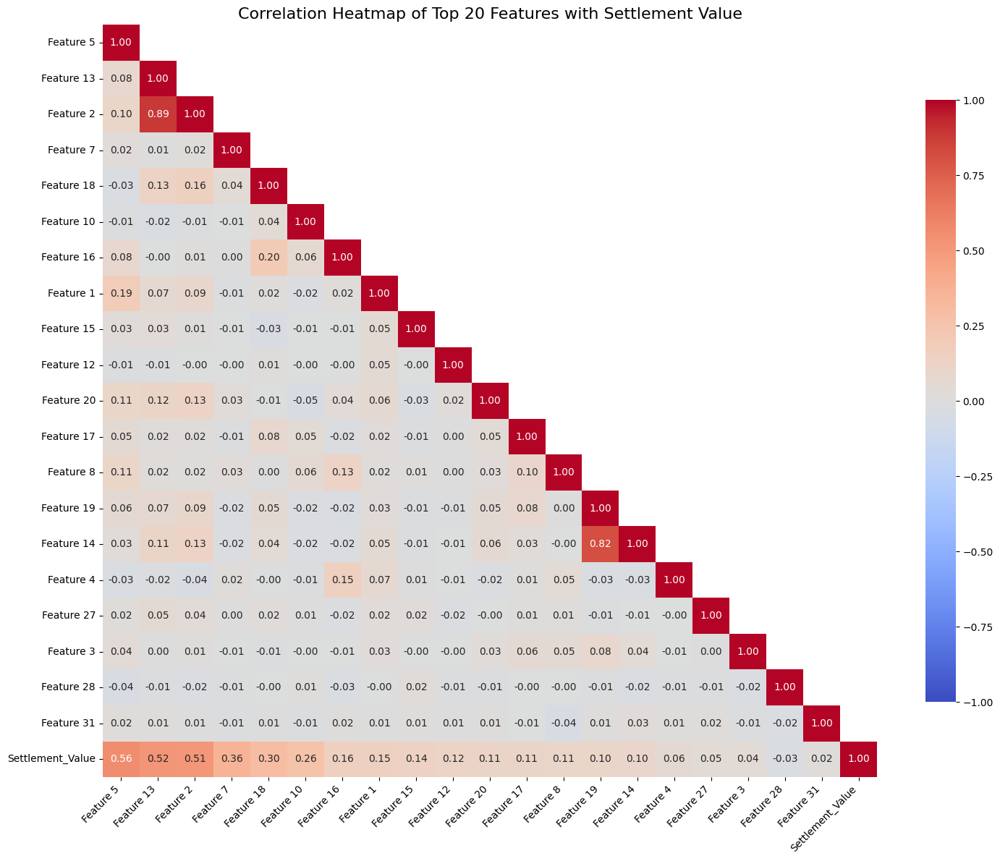

In [403]:
# Create a correlation matrix for all features
# The data is already processed and the target variable is included at the end

# Reshape y_train to be a column vector
y_train_reshaped = y_train.values.reshape(-1, 1)

# Horizontally stack X_train and y_train_reshaped
data_combined = np.hstack((X_train, y_train_reshaped))

# Compute the correlation matrix
correlation_matrix = np.corrcoef(data_combined, rowvar=False)

# Get the correlation with the target variable (last column)
correlations_with_target = correlation_matrix[-1, :-1]

# Get the absolute values of correlations
abs_correlations = np.abs(correlations_with_target)

# Get indices of features sorted by correlation with target (descending)
sorted_indices = np.argsort(-abs_correlations)

# Select top 20 correlated features
top_n = 20
top_indices = sorted_indices[:top_n]

# Create a mask to show only the selected features
mask = np.zeros((len(top_indices) + 1, len(top_indices) + 1), dtype=bool)
for i in range(len(top_indices)):
    for j in range(i+1, len(top_indices) + 1):
        mask[i, j] = True

# Create a correlation matrix with just the top features plus target
top_features_corr = np.zeros((len(top_indices) + 1, len(top_indices) + 1))
for i, idx_i in enumerate(top_indices):
    for j, idx_j in enumerate(top_indices):
        top_features_corr[i, j] = correlation_matrix[idx_i, idx_j]
    # Add correlation with target
    top_features_corr[i, -1] = correlation_matrix[idx_i, -1]
    top_features_corr[-1, i] = correlation_matrix[-1, idx_i]
top_features_corr[-1, -1] = 1.0  # Target correlation with itself

# Create a heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(top_features_corr, annot=True, cmap='coolwarm', fmt=".2f", 
            mask=mask, vmin=-1, vmax=1, cbar_kws={"shrink": .8})

# Add feature names
feature_names = [f"Feature {i+1}" for i in top_indices]
feature_names.append("Settlement_Value")
plt.xticks(np.arange(len(feature_names)) + 0.5, feature_names, rotation=45, ha='right')
plt.yticks(np.arange(len(feature_names)) + 0.5, feature_names, rotation=0)

plt.title('Correlation Heatmap of Top 20 Features with Settlement Value', fontsize=16)
plt.tight_layout()
plt.show()

In [404]:
# Create a mapping of feature numbers to feature names for the correlation analysis
# Get the original feature names from the dataset columns (excluding the target)
original_feature_names = list(insurance_data.drop(columns=['Settlement_Value']).columns)

# Calculate correlations with target
y_train_reshaped = y_train.values.reshape(-1, 1)
data_combined = np.hstack((X_train, y_train_reshaped))
correlation_matrix = np.corrcoef(data_combined, rowvar=False)
correlations_with_target = correlation_matrix[-1, :-1]
abs_correlations = np.abs(correlations_with_target)
sorted_indices = np.argsort(-abs_correlations)

# Select top 20 correlated features
top_n = 20
top_indices = sorted_indices[:top_n]

# Create and display the mapping
feature_mapping = {}
for i, idx in enumerate(top_indices):
    feature_num = i + 1
    feature_name = f"Feature {feature_num}: {original_feature_names[idx] if idx < len(original_feature_names) else 'Unknown'}"
    feature_mapping[feature_num] = feature_name
    print(feature_name)

# Add the target variable
print(f"Feature {top_n + 1}: Settlement_Value (Target)")

Feature 1: General_Rest
Feature 2: General_Fixed
Feature 3: Injury_Prognosis
Feature 4: Special_Earnings_Loss
Feature 5: Special_Therapy
Feature 6: Special_Asset_Damage
Feature 7: Special_Trip_Costs
Feature 8: Accident_Type
Feature 9: Special_Loaner_Vehicle
Feature 10: Special_Fixes
Feature 11: Minor_Psychological_Injury
Feature 12: Special_Journey_Expenses
Feature 13: Special_Usage_Loss
Feature 14: Exceptional_Circumstances
Feature 15: General_Uplift
Feature 16: Special_Overage
Feature 17: Number_Of_Passengers
Feature 18: Special_Health_Expenses
Feature 19: Accident_Description
Feature 20: Witness_Present
Feature 21: Settlement_Value (Target)


### Random Forest Feature Importance 

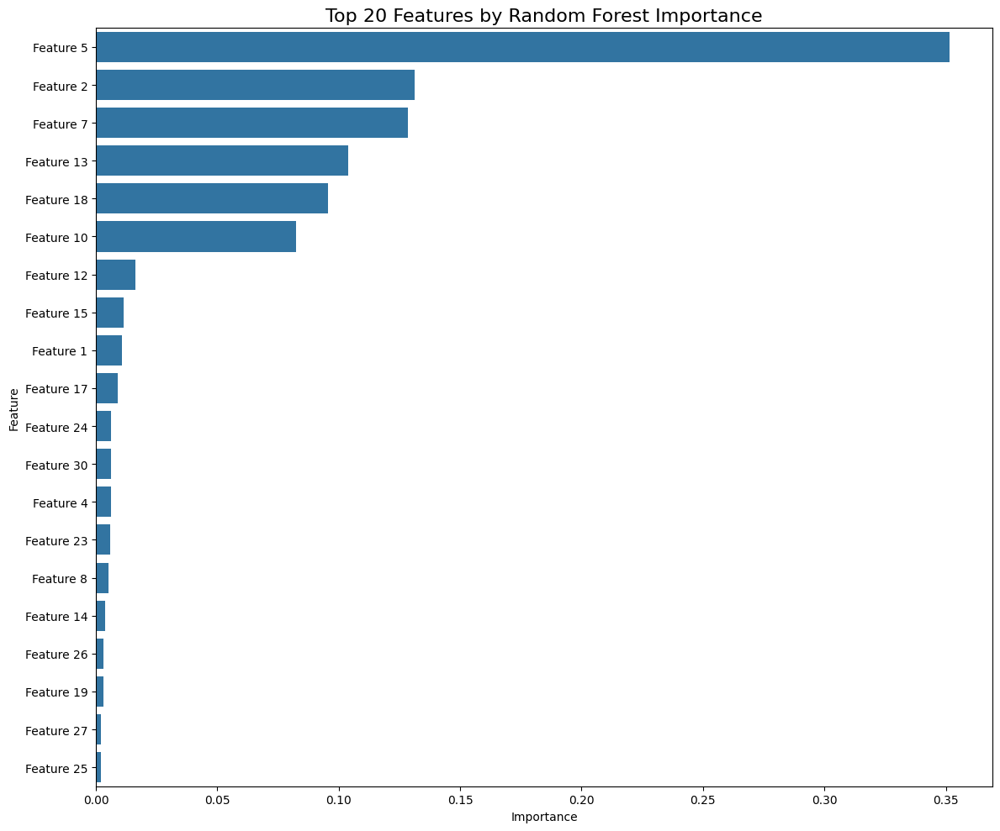

Top 20 Features by Importance:
1. Feature 5: 0.3516
2. Feature 2: 0.1311
3. Feature 7: 0.1286
4. Feature 13: 0.1037
5. Feature 18: 0.0954
6. Feature 10: 0.0823
7. Feature 12: 0.0163
8. Feature 15: 0.0114
9. Feature 1: 0.0108
10. Feature 17: 0.0091
11. Feature 24: 0.0064
12. Feature 30: 0.0062
13. Feature 4: 0.0061
14. Feature 23: 0.0057
15. Feature 8: 0.0051
16. Feature 14: 0.0037
17. Feature 26: 0.0032
18. Feature 19: 0.0030
19. Feature 27: 0.0020
20. Feature 25: 0.0020


In [405]:
# Create and train a Random Forest Regressor
rf = RandomForestRegressor(n_estimators=100, random_state=42, n_jobs=-1)
rf.fit(X_train, y_train)

# Get feature importances
importances = rf.feature_importances_

# Create generic feature names based on indices
feature_names = [f"Feature {i+1}" for i in range(len(importances))]

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': importances
}).sort_values('Importance', ascending=False)

# Plot top 20 features
plt.figure(figsize=(12, 10))
sns.barplot(x='Importance', y='Feature', data=feature_importance_df.head(20))
plt.title('Top 20 Features by Random Forest Importance', fontsize=16)
plt.tight_layout()
plt.show()

# Print the top 20 features
print("Top 20 Features by Importance:")
for i, (feature, importance) in enumerate(zip(feature_importance_df['Feature'].head(20), 
                                           feature_importance_df['Importance'].head(20))):
    print(f"{i+1}. {feature}: {importance:.4f}")

## Machine Learning Section

### Some Helper Functions

In [406]:
# Define function for hyperparameter tuning using RandomizedSearchCV
def randomsearch_tune(model, param_dist, X_train, y_train):

    random_search = RandomizedSearchCV(
        estimator = model,
        param_distributions = param_dist,
        n_iter = 100,
        cv = 5,
        scoring = "neg_mean_squared_error",
        n_jobs = -1,
        random_state = 42,
        verbose = 2
        #,error_score = 'raise'
    )
    
    random_search.fit(X_train, y_train)
    
    return random_search.best_estimator_, random_search.best_params_

In [407]:
# Define function for hyperparameter tuning using GridSearchCV
def gridsearch_tune(model, param_grid, X_train, y_train):

    grid_search = GridSearchCV(
        estimator = model,
        param_grid = param_grid,
        cv = 5,
        scoring = None,
        n_jobs = -1,
        verbose = 2
    )
    
    grid_search.fit(X_train, y_train)

    return grid_search.best_estimator_, grid_search.best_params_

In [408]:
## Provides Model Performance Metrics
def evaluate_model_performance(model, X_test, y_test):
    y_pred = model.predict(X_test)
    r2 = r2_score(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred)
    print(f"R^2:   {r2:.4f}")
    print(f"RMSE:  {rmse:.4f}")
    print(f"MAE:   {mae:.4f}")
    print(f"MAPE:  {mape:.4f}")
    return {"r2": r2, "rmse": rmse, "mae": mae, "mape": mape}

In [409]:
## Runs 10-Fold Cross Validation on a Model
def run_cv(model, X, y, cv=10):
    r2 = cross_val_score(model, X, y, scoring='r2', cv=cv)
    rmse = -cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=cv)
    mae = -cross_val_score(model, X, y, scoring='neg_mean_absolute_error', cv=cv)
    mape = -cross_val_score(model, X, y, scoring='neg_mean_absolute_percentage_error', cv=cv)

    results = {
        "r2_mean": r2.mean(), "r2_std": r2.std(),
        "rmse_mean": rmse.mean(), "rmse_std": rmse.std(),
        "mae_mean": mae.mean(), "mae_std": mae.std(),
        "mape_mean": mape.mean(), "mape_std": mape.std()
    }
    print(f"R^2:   {results['r2_mean']:.4f} ± {results['r2_std']:.4f}")
    print(f"RMSE:  {results['rmse_mean']:.4f} ± {results['rmse_std']:.4f}")
    print(f"MAE:   {results['mae_mean']:.4f} ± {results['mae_std']:.4f}")
    print(f"MAPE:  {results['mape_mean']:.4f} ± {results['mape_std']:.4f}")
    return results

In [410]:
## Predicted vs Actual Plot For a Model
def plot_predicted_vs_actual(model, X_test, y_test):
    y_pred = model.predict(X_test)
    plt.figure(figsize=(8, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.title('Predicted vs Actual Values')
    plt.tight_layout()
    plt.show()

### Simple Machine Learning Models

#### Decision Tree Regressor 

In [411]:
# Initialize decision tree regressor
dt = DecisionTreeRegressor()

dt.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'random_state': None,
 'splitter': 'best'}

In [412]:
# Define the hyperparameter grid for tuning
dt_param_grid = {
    "max_depth": [3, 5, 7, 9, 12, None],
    "min_samples_split": [2, 5, 10, 20],
    "min_samples_leaf": [1, 2, 5, 10],
    "max_features": ["sqrt", "log2", None],
    "splitter": ["best", "random"],
    "ccp_alpha": [0.0, 0.01, 0.05, 0.1],
    "max_leaf_nodes": [None, 10, 20, 50, 100]
}

# Tune the dt model
tuned_dt, dt_best_params = gridsearch_tune(dt, dt_param_grid, X_train, y_train)

# Display the best parameters
dt_best_params

Fitting 5 folds for each of 11520 candidates, totalling 57600 fits


{'ccp_alpha': 0.1,
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': 100,
 'min_samples_leaf': 1,
 'min_samples_split': 5,
 'splitter': 'random'}

In [413]:
# Make predictions
dt_y_pred = tuned_dt.predict(X_test)

In [414]:
## Performance Metrics 
evaluate_model_performance(tuned_dt, X_test, y_test)

R^2:   0.7776
RMSE:  390.0061
MAE:   240.4354
MAPE:  0.2277


{'r2': 0.7776391558526452,
 'rmse': 390.00613002101045,
 'mae': 240.43544812289767,
 'mape': 0.22770913636901785}

In [415]:
## 10-Fold Cross Validation
run_cv(tuned_dt, X_train, y_train)

R^2:   0.7900 ± 0.0470
RMSE:  362.7157 ± 31.7922
MAE:   217.0809 ± 16.8068
MAPE:  0.1973 ± 0.0153


{'r2_mean': 0.7899935990822147,
 'r2_std': 0.04695025119303665,
 'rmse_mean': 362.71573609417675,
 'rmse_std': 31.792170315978716,
 'mae_mean': 217.0809489685151,
 'mae_std': 16.80679133846052,
 'mape_mean': 0.19726246568778363,
 'mape_std': 0.015320001803272792}

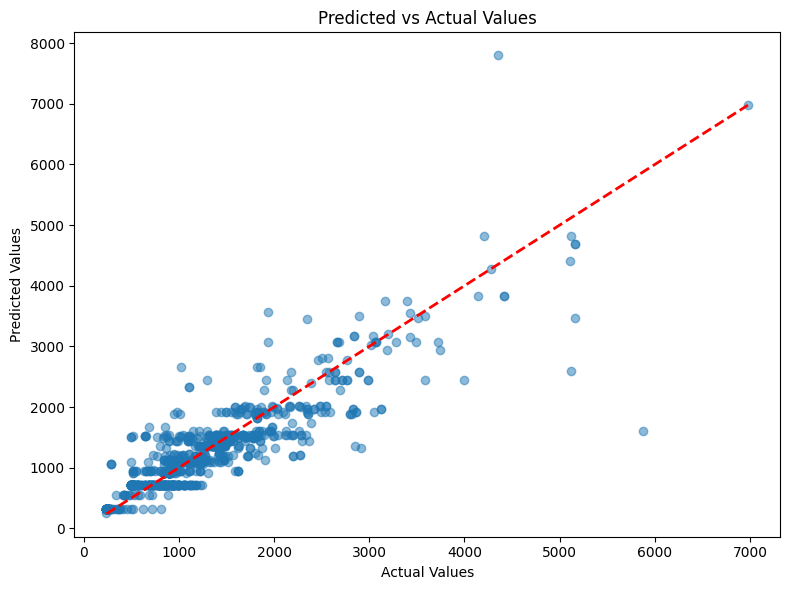

In [416]:
## Error Analylsis
plot_predicted_vs_actual(tuned_dt, X_test, y_test)

#### Random Forest Regressor 

In [417]:
# Initialize Random Forest Regressor
rf = RandomForestRegressor()
rf.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'squared_error',
 'max_depth': None,
 'max_features': 1.0,
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'monotonic_cst': None,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [418]:
# Define the hyperparameter for tuning

rf_param_grid = {
    'n_estimators': [50, 100, 200],  # Number of trees in the forest
    'max_depth': [None, 10, 20, 30],  # Maximum depth of the tree
    'min_samples_split': [2, 5, 10],  # Minimum samples required to split a node
    'min_samples_leaf': [1, 2, 4],    # Minimum samples required at each leaf node
    'max_features': ['log2', 'sqrt', None]  # Number of features to consider at each split
}

rf_param_dist = {
    'n_estimators': randint(100, 1000),  # Number of trees
    'max_depth': randint(5, 20),          # Max depth of trees
    'min_samples_split': randint(2, 10),  # Min samples required to split a node
    'min_samples_leaf': randint(1, 10),   # Min samples required to be at a leaf node
    'max_features': [None, 'sqrt', 'log2'],  # Max features for split
    'bootstrap': [True, False],           # Whether bootstrap samples
    'criterion': ['squared_error', 'poisson'],  # Criterion for splitting
    'max_leaf_nodes': randint(10, 100),   # Max number of leaf nodes
}

# Perform RandomizedSearchCV
tuned_rf, rf_best_params = gridsearch_tune(rf, rf_param_grid, X_train, y_train)

Fitting 5 folds for each of 324 candidates, totalling 1620 fits


In [419]:
## Make Predictions
rf_y_pred = tuned_rf.predict(X_test)

In [420]:
## Evaluate Metrics
evaluate_model_performance(tuned_rf, X_test, y_test)

R^2:   0.9185
RMSE:  236.1379
MAE:   124.8764
MAPE:  0.1031


{'r2': 0.9184832468772468,
 'rmse': 236.13790870274707,
 'mae': 124.87638825995805,
 'mape': 0.10306458441802038}

In [421]:
## 10-Fold Cross Validation
run_cv(tuned_dt, X_train, y_train)

R^2:   0.7776 ± 0.0463
RMSE:  380.7959 ± 54.6112
MAE:   211.5053 ± 11.4097
MAPE:  0.1931 ± 0.0162


{'r2_mean': 0.7776166716427104,
 'r2_std': 0.04628697116245697,
 'rmse_mean': 380.7959075696776,
 'rmse_std': 54.6111547090134,
 'mae_mean': 211.50527966573932,
 'mae_std': 11.409672312919323,
 'mape_mean': 0.19308370608804537,
 'mape_std': 0.016233033717303082}

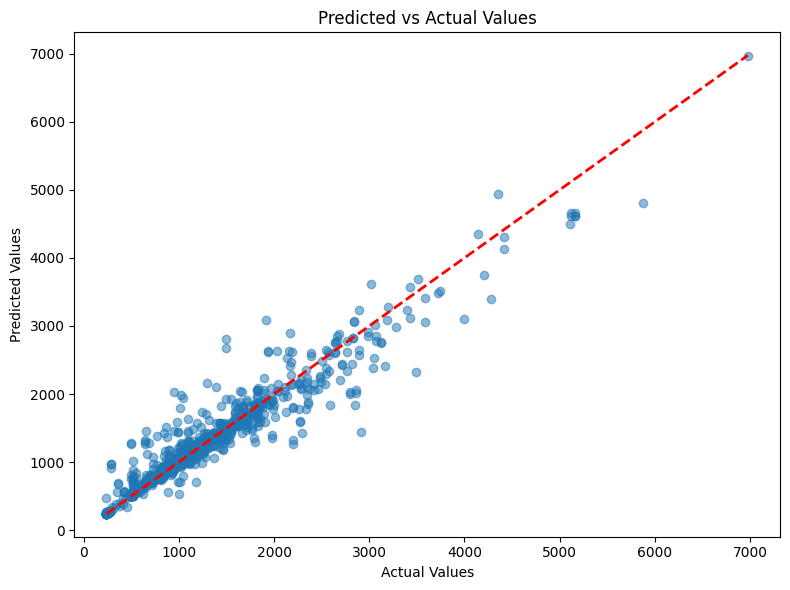

In [422]:
## Error Analysis 
plot_predicted_vs_actual(tuned_rf, X_test, y_test)

#### Gradient Boosting Regressor

In [423]:
# Initialize the model
gbr = GradientBoostingRegressor(random_state=42)

gbr.get_params()

{'alpha': 0.9,
 'ccp_alpha': 0.0,
 'criterion': 'friedman_mse',
 'init': None,
 'learning_rate': 0.1,
 'loss': 'squared_error',
 'max_depth': 3,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_iter_no_change': None,
 'random_state': 42,
 'subsample': 1.0,
 'tol': 0.0001,
 'validation_fraction': 0.1,
 'verbose': 0,
 'warm_start': False}

In [424]:
# Define the hyperparameter grid for tuning
gbr_param_grid = {
    'n_estimators': [100, 200, 300, 500],
    'learning_rate': [0.01, 0.05, 0.1, 0.2],
    'max_depth': [3, 4, 5, 6],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 3, 5],
    'subsample': [0.7, 0.8, 0.9, 1.0],
    'max_features': ['sqrt', 'log2', None]
}

# Initialize Random Search
tuned_gbr, gbr_best_params = randomsearch_tune(gbr, gbr_param_grid, X_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits


In [425]:
# Make predictions
gbr_y_pred = tuned_gbr.predict(X_test)

In [426]:
## Evaluate Metrics
evaluate_model_performance(tuned_gbr, X_test, y_test)

R^2:   0.9330
RMSE:  214.1072
MAE:   117.9574
MAPE:  0.1087


{'r2': 0.9329840583450268,
 'rmse': 214.1072327054028,
 'mae': 117.9574381790571,
 'mape': 0.10870369221923967}

In [427]:
## 10-Fold Cross Validation 
run_cv(tuned_gbr, X_train, y_train)

R^2:   0.8988 ± 0.0473
RMSE:  267.3013 ± 53.5747
MAE:   130.2553 ± 11.0103
MAPE:  0.1148 ± 0.0119


{'r2_mean': 0.8988471030505256,
 'r2_std': 0.0472629498147327,
 'rmse_mean': 267.3012552468675,
 'rmse_std': 53.5747172768543,
 'mae_mean': 130.2552783921214,
 'mae_std': 11.0102785231899,
 'mape_mean': 0.11484931233640254,
 'mape_std': 0.011924337808798825}

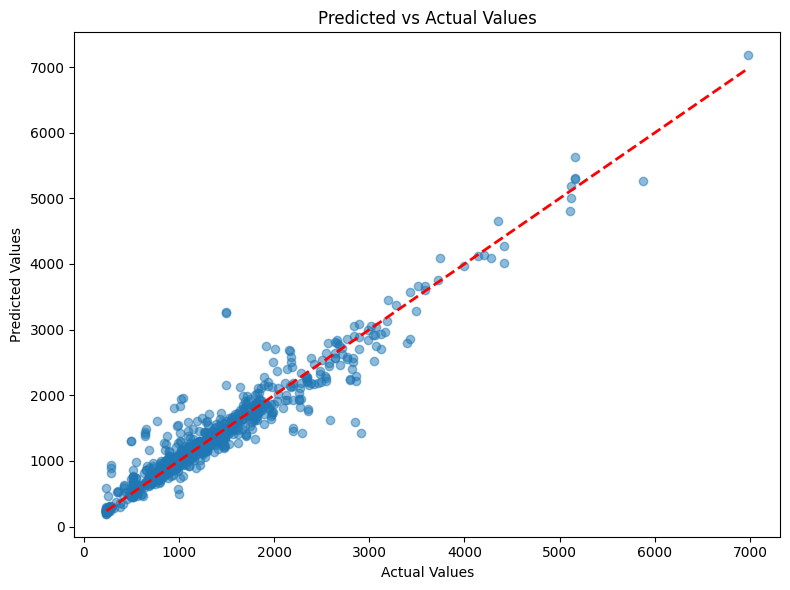

In [428]:
## Error Analysis
plot_predicted_vs_actual(tuned_gbr, X_test, y_test)

#### Extreme Gradient Boosting Regressor 

In [429]:
# Initialize XGBoost Regressor
xgb = XGBRegressor()

# Define the hyperparameters of XGBoost Regressor
xgb_param_grid = {
    "n_estimators": [50, 100, 200, 300, 400, 500],
    "learning_rate": [0.01, 0.05, 0.1, 0.2],
    "max_depth": [3, 5, 7, 10, 15],
    "min_child_weight": [1, 3, 5, 7, 10],
    "subsample": [0.5, 0.7, 1.0],
    "colsample_bytree": [0.5, 0.7, 1.0],
    "reg_alpha": [0, 0.1, 0.5, 1.0],
    "reg_lambda": [0, 1, 5, 10]
}

xgb_param_dist = {
    "n_estimators": randint(50, 500),
    "learning_rate": uniform(0.01, 0.2),
    "max_depth": randint(3, 15),
    "min_child_weight": randint(1, 10),
    "subsample": uniform(0.5, 0.5),
    "colsample_bytree": uniform(0.5, 0.5),
    "reg_alpha": uniform(0, 1),
    "reg_lambda": uniform(0, 10)
}

# Tune the XGBoost model
tuned_xgb, xgb_best_params = randomsearch_tune(xgb, xgb_param_dist, X_train, y_train)

# Display the best parameters
xgb_best_params

Fitting 5 folds for each of 100 candidates, totalling 500 fits


{'colsample_bytree': 0.6596568187952074,
 'learning_rate': 0.200012393410161,
 'max_depth': 6,
 'min_child_weight': 3,
 'n_estimators': 416,
 'reg_alpha': 0.08328441119525964,
 'reg_lambda': 0.9170414725848108,
 'subsample': 0.8012204629505595}

In [430]:
## Make Predictions 
xgb_y_pred = tuned_xgb.predict(X_test)


In [431]:
## Evaluate Metrics 
evaluate_model_performance(tuned_xgb, X_test, y_test)

R^2:   0.9217
RMSE:  231.5029
MAE:   136.7051
MAPE:  0.1237


{'r2': 0.9216519416345043,
 'rmse': 231.50287843213826,
 'mae': 136.70510797016775,
 'mape': 0.12366832443951445}

In [432]:
## 10-Fold Cross Validation
run_cv(tuned_xgb, X_train, y_train, cv=10)

R^2:   0.8907 ± 0.0355
RMSE:  281.0014 ± 34.3472
MAE:   150.0873 ± 10.9435
MAPE:  0.1302 ± 0.0122


{'r2_mean': 0.890669586365173,
 'r2_std': 0.035518337931656783,
 'rmse_mean': 281.00138698580844,
 'rmse_std': 34.34723338030379,
 'mae_mean': 150.08731637734067,
 'mae_std': 10.943523129113945,
 'mape_mean': 0.13021670140696842,
 'mape_std': 0.0121858701870697}

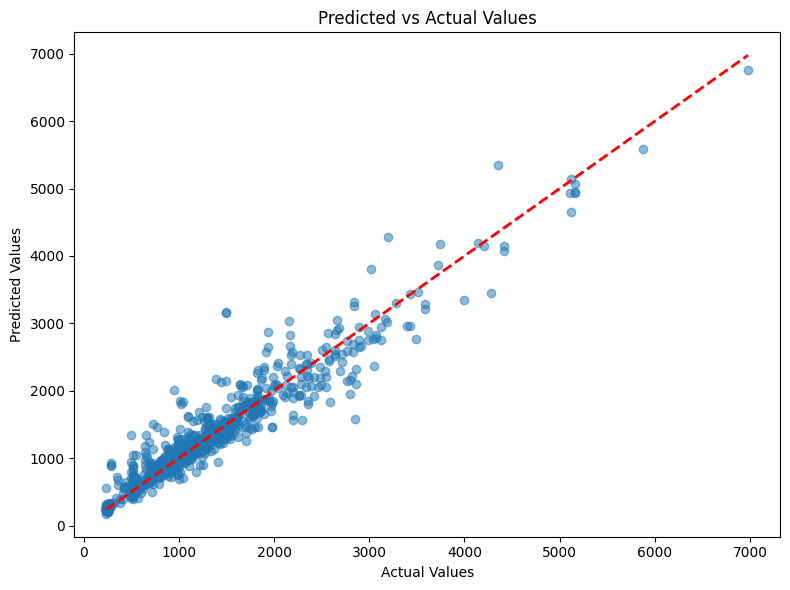

In [433]:
## Error Analysis 
plot_predicted_vs_actual(tuned_xgb, X_test, y_test)

#### Light Gradient Boosting Algorithm

In [434]:
lgbm = LGBMRegressor()

lgbm.get_params()

{'boosting_type': 'gbdt',
 'class_weight': None,
 'colsample_bytree': 1.0,
 'importance_type': 'split',
 'learning_rate': 0.1,
 'max_depth': -1,
 'min_child_samples': 20,
 'min_child_weight': 0.001,
 'min_split_gain': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'num_leaves': 31,
 'objective': None,
 'random_state': None,
 'reg_alpha': 0.0,
 'reg_lambda': 0.0,
 'subsample': 1.0,
 'subsample_for_bin': 200000,
 'subsample_freq': 0}

In [438]:
"""

lgbm_param_dist = {
    'n_estimators': np.arange(50, 500, 50),  # Number of boosting rounds
    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate
    'max_depth': np.arange(3, 10),  # Maximum depth of trees
    'num_leaves': np.arange(20, 100, 10),  # Maximum number of leaves
    'min_child_samples': np.arange(10, 50, 10),  # Minimum data in a leaf
    'subsample': [0.6, 0.8, 1.0],  # Subsample ratio
    'colsample_bytree': [0.6, 0.8, 1.0],  # Feature subsample ratio
    'reg_alpha': [0, 0.1, 0.5],  # L1 regularization
    'reg_lambda': [0, 0.1, 0.5],  # L2 regularization
}

# Perform RandomizedSearchCV
tuned_lgbm, lgbm_best_params = randomsearch_tune(lgbm, lgbm_param_dist, X_train, y_train)
"""


"\n\nlgbm_param_dist = {\n    'n_estimators': np.arange(50, 500, 50),  # Number of boosting rounds\n    'learning_rate': [0.01, 0.05, 0.1, 0.2],  # Learning rate\n    'max_depth': np.arange(3, 10),  # Maximum depth of trees\n    'num_leaves': np.arange(20, 100, 10),  # Maximum number of leaves\n    'min_child_samples': np.arange(10, 50, 10),  # Minimum data in a leaf\n    'subsample': [0.6, 0.8, 1.0],  # Subsample ratio\n    'colsample_bytree': [0.6, 0.8, 1.0],  # Feature subsample ratio\n    'reg_alpha': [0, 0.1, 0.5],  # L1 regularization\n    'reg_lambda': [0, 0.1, 0.5],  # L2 regularization\n}\n\n# Perform RandomizedSearchCV\ntuned_lgbm, lgbm_best_params = randomsearch_tune(lgbm, lgbm_param_dist, X_train, y_train)\n"

In [436]:
# Initialize LGBM with your best parameters
tuned_lgbm = LGBMRegressor(
    subsample=0.8,
    reg_lambda=0.1,
    reg_alpha=0,
    num_leaves=30,
    n_estimators=450,
    min_child_samples=10,
    max_depth=8,
    learning_rate=0.1,
    colsample_bytree=0.6,
    random_state=42  # Adding random_state for reproducibility
)

In [437]:
tuned_lgbm.fit(X_train, y_train)

tuned_lgbm.predict(X_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 39
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

array([ 858.10883558, 1173.04621643,  939.78326491,  846.13441216,
       4750.04631401, 3614.89886126, 1915.27332903,  874.12293762,
       1004.80200047, 1372.31100719, 1819.66724266,  499.46710362,
        691.15216035,  464.84293309,  764.07486   ,  235.02380517,
       2384.21830438,  534.21652288,  919.61114209, 2633.25285187,
       2116.30467812,  251.96973153, 1237.98431715,  932.52456888,
        788.65587679, 1335.45318565, 2385.07888168,  675.9048318 ,
        866.98408893, 1895.21406151,  326.81866958, 2517.27838441,
        856.24989438,  448.79649875,  948.58712913,  383.04599833,
       1044.35932973,  863.94812258, 1635.26347995, 1703.37316384,
        214.09374928,  899.7486163 , 1765.08534561, 1172.21530363,
        490.48344756, 1639.37655293,  933.7301357 ,  463.00992302,
        488.95532791, 1848.02265409,  750.82121441, 1357.73183443,
        926.88565807,  447.6394638 ,  909.82201442,  856.62048379,
       1702.2020768 , 1476.43556554,  271.01896658,  479.69666

In [439]:
## Evaluate performance 
evaluate_model_performance(tuned_lgbm, X_test, y_test)

R^2:   0.9058
RMSE:  253.7914
MAE:   148.0952
MAPE:  0.1344


{'r2': 0.9058394011996953,
 'rmse': 253.79138863351784,
 'mae': 148.09522729346008,
 'mape': 0.13440245529579362}

In [440]:
## 10-Fold Cross Validation
run_cv(tuned_lgbm, X_train, y_train, cv=10)


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000826 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1227
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 39
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

{'r2_mean': 0.8613879846313948,
 'r2_std': 0.04849927685251544,
 'rmse_mean': 316.2451404814763,
 'rmse_std': 42.156101680015865,
 'mae_mean': 167.14668963699538,
 'mae_std': 10.840188537569713,
 'mape_mean': 0.1456218239960334,
 'mape_std': 0.013766723867867888}

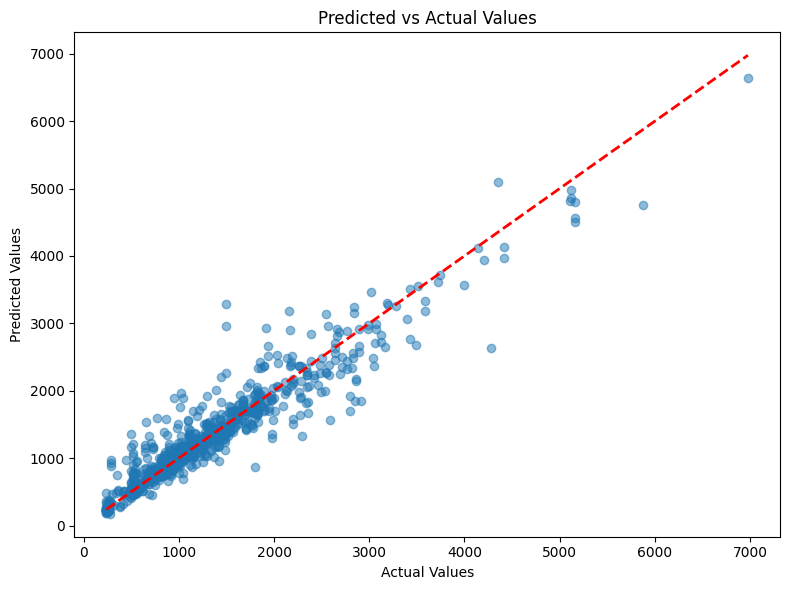

In [441]:
## Error Analysis
plot_predicted_vs_actual(tuned_lgbm, X_test, y_test)

### Deep Learning (DNN)

In [442]:
scaler = StandardScaler()
# Fit the scaler on the training set only
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [443]:
model = Sequential()
model.add(Dense(256, input_dim=X_train_scaled.shape[1], activation='elu'))
model.add(Dense(128, activation='elu'))
model.add(Dropout(0.2))  # Dropout layer to prevent overfittingodel.add(Dense(64, activation='elu'))
model.add(Dense(48, activation='elu'))
model.add(Dropout(0.2))  # Dropout layer to prevent overfittingodel.add(Dense(32, activation='elu'))
model.add(Dense(16, activation='elu'))
model.add(Dense(1, activation='linear'))  # Output layer for regression

# Compile the model
optimizer = Adam(learning_rate=0.00085)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])
# Early stopping
early_stopping = EarlyStopping(monitor='val_mae', patience=15, restore_best_weights=True)

history = model.fit(X_train_scaled, y_train, epochs=300,batch_size=48, validation_split=0.2)

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step - loss: 2268461.0000 - mae: 1220.8379 - val_loss: 2193922.2500 - val_mae: 1213.9379
Epoch 2/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1712058.5000 - mae: 1056.3813 - val_loss: 337115.8125 - val_mae: 448.9961
Epoch 3/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 283830.0625 - mae: 395.4992 - val_loss: 122657.5547 - val_mae: 224.3133
Epoch 4/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 171310.5625 - mae: 257.5667 - val_loss: 119614.4766 - val_mae: 217.4143
Epoch 5/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 154268.5469 - mae: 249.2786 - val_loss: 118705.2266 - val_mae: 212.5748
Epoch 6/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 135162.9844 - mae: 235.2630 - val_loss: 117762.6641 - val_mae: 208.1885
Epoch 7/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 141828.2969 - mae: 234.9618 - val_loss: 116902.8438 - val_mae: 208.5842
Epoch 8/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 191304.8594 - mae:

In [444]:
## Evaluate Model Performance 
evaluate_model_performance(model, X_test_scaled, y_test)

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
R^2:   0.8106
RMSE:  359.9103
MAE:   229.3718
MAPE:  0.2040


{'r2': 0.8106331106550823,
 'rmse': 359.9103192462411,
 'mae': 229.37181803833263,
 'mape': 0.20396806116731087}

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step 


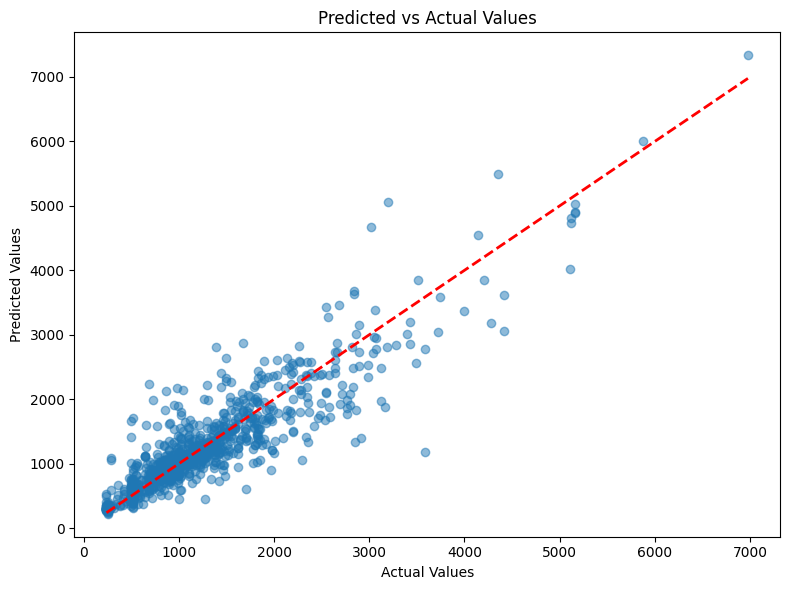

In [445]:
## Error Analysis
plot_predicted_vs_actual(model, X_test_scaled, y_test)

## Single Model Performance Comparison

In [446]:
# Define the models to include in the comparison
models = {
    'Decision Tree': tuned_dt,
    'Random Forest': tuned_rf,
    'Gradient Boosting': tuned_gbr,
    'XGBoost': tuned_xgb,
    'LightGBM': tuned_lgbm,
}

# Initialize a dictionary to store the metrics
metrics_dict = {
    'Model': [],
    'R²': [],
    'RMSE': [],
    'MAE': [],
    'MAPE (%)': []
}

# Calculate metrics for each model
for model_name, model_instance in models.items():
    # Add model name
    metrics_dict['Model'].append(model_name)
    
    y_pred = model_instance.predict(X_test)
    
    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = root_mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    mape = mean_absolute_percentage_error(y_test, y_pred) * 100  # Convert to percentage
    
    # Add metrics to the dictionary
    metrics_dict['R²'].append(round(r2, 4))
    metrics_dict['RMSE'].append(round(rmse, 2))
    metrics_dict['MAE'].append(round(mae, 2))
    metrics_dict['MAPE (%)'].append(round(mape, 2))

# Create DataFrame from the metrics dictionary
metrics_df = pd.DataFrame(metrics_dict)

# Display the DataFrame with styling
from IPython.display import display
display(metrics_df.style.highlight_max(subset=['R²'], color='lightgreen')
                      .highlight_min(subset=['RMSE', 'MAE', 'MAPE (%)'], color='lightgreen')
                      .format({'R²': '{:.4f}', 'RMSE': '{:.2f}', 'MAE': '{:.2f}', 'MAPE (%)': '{:.2f}%'}))

# For simple console output
print("\nModel Performance Comparison:")
print(metrics_df.to_string(index=False))

,Model,R²,RMSE,MAE,MAPE (%)
0,Decision Tree,0.7776,390.01,240.44,22.77%
1,Random Forest,0.9185,236.14,124.88,10.31%
2,Gradient Boosting,0.9330,214.11,117.96,10.87%
3,XGBoost,0.9217,231.50,136.71,12.37%
4,LightGBM,0.9058,253.79,148.10,13.44%



Model Performance Comparison:
            Model     R²   RMSE    MAE  MAPE (%)
    Decision Tree 0.7776 390.01 240.44     22.77
    Random Forest 0.9185 236.14 124.88     10.31
Gradient Boosting 0.9330 214.11 117.96     10.87
          XGBoost 0.9217 231.50 136.71     12.37
         LightGBM 0.9058 253.79 148.10     13.44


## Complex Machine Learning Models (Ensemble and Other Tests)

#### Gradient Boosting Ensemble 

In [447]:
rf = RandomForestRegressor(max_depth=20, max_features=None, min_samples_leaf=1, min_samples_split=5, n_estimators=50)
gbr = GradientBoostingRegressor(subsample = 1.0, n_estimators=500, min_samples_split=10, min_samples_leaf=1,max_features=None, max_depth=4,learning_rate=0.2)
xgb = XGBRegressor(colsample_bytree=0.565,learning_rate=0.2,max_depth = 6, min_child_weight=1, n_estimators=420, reg_alpha=0.757, reg_lambda=0.469,subsample=0.634)
lgbm = LGBMRegressor(subsample = 0.8, reg_lambda=0.1,reg_alpha=0.5,num_leaves=60,n_estimators=300,min_child_samples=10,max_depth=9,learning_rate=0.1,colsample_bytree=0.6)

In [448]:
# Define the meta learner
meta_learner = gbr

# Define the stacking ensemble
estimators = [('rf', rf), ('xgb', xgb), ('lgbm', lgbm)]
stacking_regressor = StackingRegressor(estimators=estimators, final_estimator=meta_learner, cv=10)

# Train the stacking ensemble
stacking_regressor.fit(X_train, y_train)

# Make predictions
stacking_y_pred = stacking_regressor.predict(X_test)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001328 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1279
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 39
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

In [449]:
##Evaluate Model Performance
evaluate_model_performance(stacking_regressor, X_test, y_test)

R^2:   0.8972
RMSE:  265.1430
MAE:   146.1375
MAPE:  0.1222


{'r2': 0.8972277696870958,
 'rmse': 265.1430006411241,
 'mae': 146.13748876437606,
 'mape': 0.12215987518256627}

In [450]:
## 10-Fold Cross Validation
run_cv(stacking_regressor, X_train, y_train, cv=10)

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1227
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 39
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

{'r2_mean': 0.8568562825256809,
 'r2_std': 0.04939854389923213,
 'rmse_mean': 302.94747228770837,
 'rmse_std': 42.01759421199259,
 'mae_mean': 160.56414395493874,
 'mae_std': 13.287177439184026,
 'mape_mean': 0.12658075200524038,
 'mape_std': 0.016721163462801367}

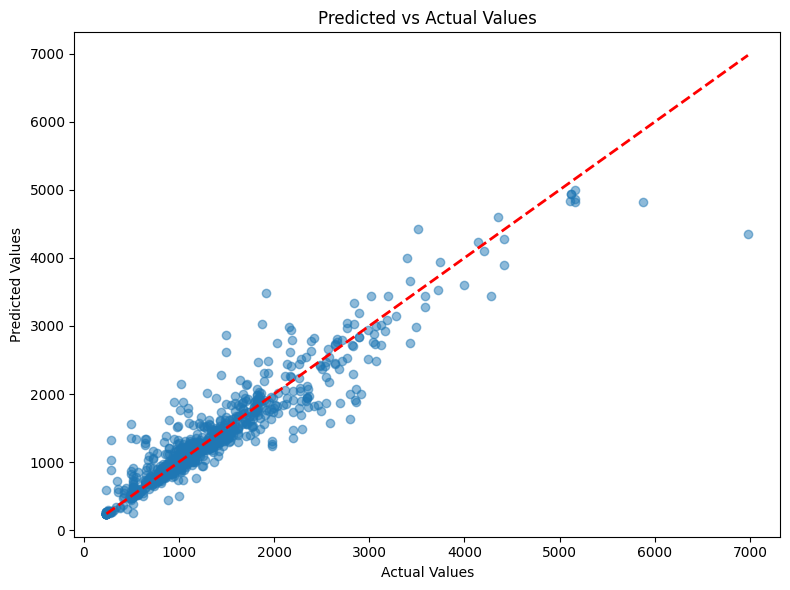

In [451]:
## Error Analysis
plot_predicted_vs_actual(stacking_regressor, X_test, y_test)

#### Gradient Boosting Ensemble - DNN 

In [452]:
# Fixed function for generating meta-features with proper indexing
def get_meta_features(model, X_train, y_train, X_test, n_folds=5):
    # Initialize arrays to store predictions
    train_meta_features = np.zeros(len(X_train))
    
    # Convert pandas Series to numpy if needed
    if hasattr(y_train, 'values'):
        y_values = y_train.values
    else:
        y_values = y_train
    
    # Cross-validation for training predictions
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    
    for train_idx, val_idx in kf.split(X_train):
        # Split data
        X_train_fold, X_val_fold = X_train[train_idx], X_train[val_idx]
        y_train_fold = y_values[train_idx]  # Use numpy values instead of pandas indexing
        
        # Train model on fold
        model.fit(X_train_fold, y_train_fold)
        
        # Generate predictions for validation fold
        train_meta_features[val_idx] = model.predict(X_val_fold)
    
    # Train final model on all training data for test predictions
    model.fit(X_train, y_train)
    test_meta_features = model.predict(X_test)
    
    return train_meta_features, test_meta_features

# 1. GB Component
xgb = GradientBoostingRegressor(
    subsample=0.9, 
    n_estimators=300, 
    min_samples_split=10, 
    min_samples_leaf=1, 
    max_features=None, 
    max_depth=5, 
    learning_rate=0.1
)

# Generate meta-features using cross-validation
xgb_train_meta, xgb_test_meta = get_meta_features(xgb, X_train, y_train, X_test)

# 2. Stack predictions with original features
X_train_stacked = np.column_stack((X_train, xgb_train_meta.reshape(-1, 1)))
X_test_stacked = np.column_stack((X_test, xgb_test_meta.reshape(-1, 1)))

# 3. Scale the combined features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_stacked)
X_test_scaled = scaler.transform(X_test_stacked)

# 4. DNN component
input_dim = X_train_scaled.shape[1]

model = Sequential()
model.add(Dense(256, input_shape=(input_dim,), activation='elu'))
model.add(Dense(128, activation='elu'))
model.add(Dense(64, activation='elu'))
model.add(Dropout(0.2))
model.add(Dense(48, activation='elu'))
model.add(Dense(32, activation='elu'))
model.add(Dense(16, activation='elu'))
model.add(Dense(1, activation='linear'))

# Compile the model
optimizer = Adam(learning_rate=0.00085)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_mae', 
    patience=15, 
    restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train_scaled, 
    y_train, 
    epochs=300,
    batch_size=48, 
    validation_split=0.2,
    callbacks=[early_stopping]
)

# Make predictions
y_pred = model.predict(X_test_scaled)

KeyError: "None of [Index([   1,    2,    3,    4,    5,    6,    7,    8,    9,   10,\n       ...\n       3800, 3801, 3803, 3804, 3805, 3806, 3807, 3808, 3810, 3811],\n      dtype='int32', length=3049)] are in the [columns]"

In [ ]:
## Evaluate Model Performance 
evaluate_model_performance(model, X_test_scaled, y_test)

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
R^2:   0.9213
RMSE:  231.9532
MAE:   135.4308
MAPE:  0.1221


{'r2': 0.9213468443869287,
 'rmse': 231.95319120720814,
 'mae': 135.430757510907,
 'mape': 0.12212536384899089}

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


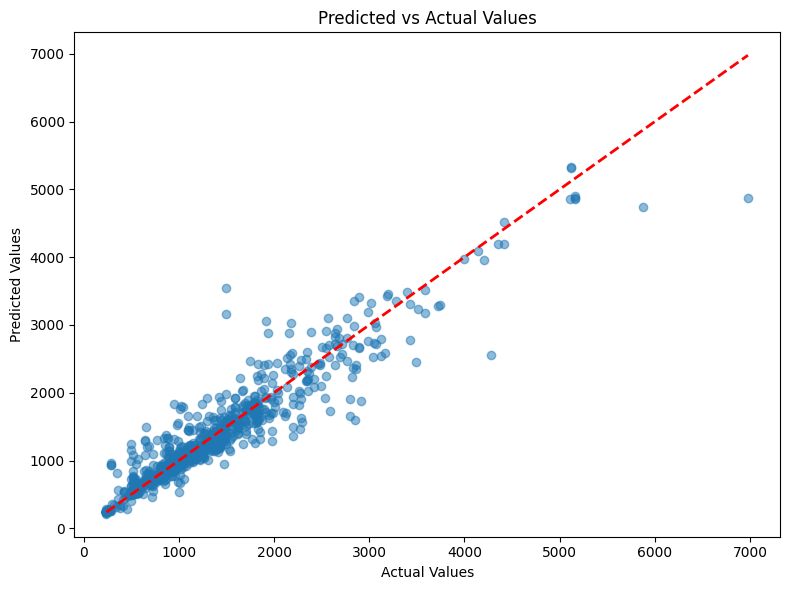

In [ ]:
## Error Analysis
plot_predicted_vs_actual(stacking_regressor, X_test, y_test)

#### Random Forest - DNN Regressor

In [ ]:
# Function to generate out-of-fold predictions
def get_oof_predictions(model, X_train, y_train, X_test, n_folds=5):
    # Initialize array for OOF predictions
    oof_train = np.zeros(len(X_train))
    
    # Convert y_train to numpy array if it's a pandas Series
    if hasattr(y_train, 'values'):
        y_values = y_train.values
    else:
        y_values = y_train
    
    # Create KFold object
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    
    # Generate OOF predictions for training data
    for train_idx, val_idx in kf.split(X_train):
        X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
        y_fold_train = y_values[train_idx]
        
        # Train model on fold
        model.fit(X_fold_train, y_fold_train)
        
        # Generate predictions for validation fold
        oof_train[val_idx] = model.predict(X_fold_val)
    
    # Train the model on the full training set for test predictions
    model.fit(X_train, y_train)
    oof_test = model.predict(X_test)
    
    return oof_train, oof_test

# 1. Create and get OOF predictions from RandomForest
rf = RandomForestRegressor(
    max_depth=None, 
    max_features=None,
    min_samples_leaf=1,
    min_samples_split=2, 
    n_estimators=200,
    random_state=42
)

# Generate OOF predictions
rf_train_oof, rf_test_pred = get_oof_predictions(rf, X_train, y_train, X_test)

# 2. Stack OOF predictions with original features
X_train_stacked = np.column_stack((X_train, rf_train_oof.reshape(-1, 1)))
X_test_stacked = np.column_stack((X_test, rf_test_pred.reshape(-1, 1)))

# 3. Scale the stacked features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_stacked)
X_test_scaled = scaler.transform(X_test_stacked)

# 4. Create and train the DNN model
input_dim = X_train_scaled.shape[1]

model = Sequential()
model.add(Dense(256, input_shape=(input_dim,), activation='elu'))
model.add(Dense(128, activation='elu'))
model.add(Dense(64, activation='elu'))
model.add(Dropout(0.2))  # Add dropout for regularization
model.add(Dense(48, activation='elu'))
model.add(Dense(32, activation='elu'))
model.add(Dense(16, activation='elu'))
model.add(Dense(1, activation='linear'))

# Compile the model
optimizer = Adam(learning_rate=0.00085)
model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_mae',
    patience=15,
    restore_best_weights=True
)

# Train the model
history = model.fit(
    X_train_scaled,
    y_train,
    epochs=300,
    batch_size=48,
    validation_split=0.2,
    callbacks=[early_stopping]
)

# 5. Make predictions on test set
rf_y_pred_comb = model.predict(X_test_scaled)

Epoch 1/300


c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 2117686.7500 - mae: 1189.5955 - val_loss: 1685070.8750 - val_mae: 1082.8352
Epoch 2/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 878936.2500 - mae: 729.3045 - val_loss: 101467.5234 - val_mae: 219.9951
Epoch 3/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 137158.0312 - mae: 230.1462 - val_loss: 90168.5547 - val_mae: 183.3121
Epoch 4/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 120178.2422 - mae: 210.1769 - val_loss: 90950.0312 - val_mae: 184.2233
Epoch 5/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 134965.2344 - mae: 209.5846 - val_loss: 89537.3125 - val_mae: 173.9361
Epoch 6/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 123141.0156 - mae: 199.4171 - val_loss: 81786.7578 - val_mae: 172.3710
Epoch 7/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 126831.5312 - mae: 202.2195 - val_loss: 78562.2422 - val_mae: 165.8355
Epoch 8/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 106095.8906 - mae: 185.7918 - val_los

In [ ]:
## Model Performance 
evaluate_model_performance(model, X_test_scaled, y_test)  

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 
R^2:   0.9134
RMSE:  243.3672
MAE:   143.8236
MAPE:  0.1275


{'r2': 0.9134156424502914,
 'rmse': 243.36717205786573,
 'mae': 143.82356331943217,
 'mape': 0.12747879685061053}

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step 


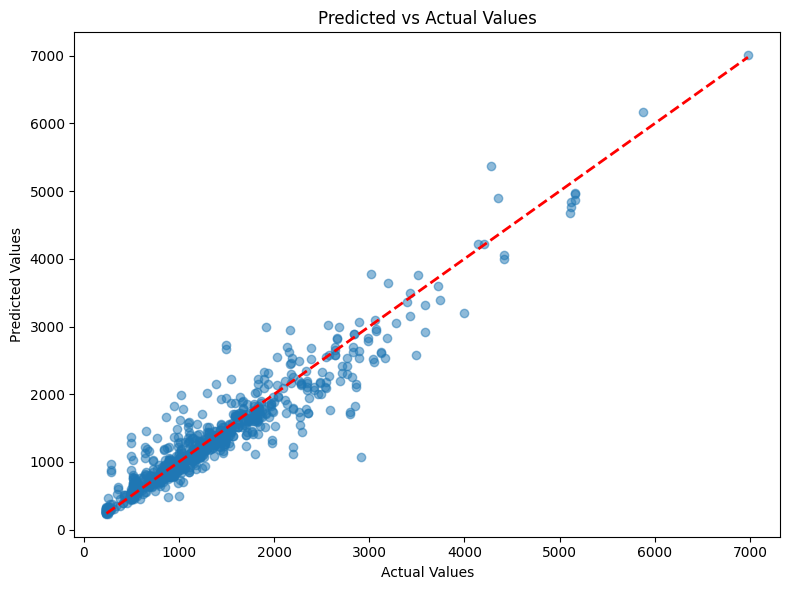

In [ ]:
## Error Analysis
plot_predicted_vs_actual(model, X_test_scaled, y_test)

#### Gradient Boosting Ensemble - DNN Regressor 

In [ ]:
# Function to generate OOF predictions for multiple models
def get_oof_predictions(models, X_train, y_train, X_test, n_folds=5):
    # Initialize arrays for all models' OOF predictions
    n_models = len(models)
    n_train = X_train.shape[0]
    n_test = X_test.shape[0]
    
    oof_train = np.zeros((n_train, n_models))
    oof_test = np.zeros((n_test, n_models))
    
    # Convert y_train to numpy array if it's a pandas Series
    if hasattr(y_train, 'values'):
        y_values = y_train.values
    else:
        y_values = y_train
    
    # Create KFold object
    kf = KFold(n_splits=n_folds, shuffle=True, random_state=42)
    
    # For each model
    for i, (name, model) in enumerate(models.items()):
        print(f"Generating OOF predictions for {name}...")
        
        # Initialize test predictions for this model
        test_preds = np.zeros((n_test, n_folds))
        
        # Generate OOF predictions for training data
        for fold, (train_idx, val_idx) in enumerate(kf.split(X_train)):
            X_fold_train, X_fold_val = X_train[train_idx], X_train[val_idx]
            y_fold_train = y_values[train_idx]
            
            # Train model on fold
            model.fit(X_fold_train, y_fold_train)
            
            # Generate predictions for validation fold
            oof_train[val_idx, i] = model.predict(X_fold_val)
            
            # Generate predictions for test data
            test_preds[:, fold] = model.predict(X_test)
        
        # Average test predictions across folds
        oof_test[:, i] = test_preds.mean(axis=1)
        
    return oof_train, oof_test

# 1. Create base models
models = {
    'rf': RandomForestRegressor(
        max_depth=None, 
        max_features=None,
        min_samples_leaf=1,
        min_samples_split=2, 
        n_estimators=200,
        random_state=42
    ),
    'gbr': GradientBoostingRegressor(
        subsample=1.0, 
        n_estimators=300, 
        min_samples_split=10, 
        min_samples_leaf=1,
        max_features=None, 
        max_depth=5,
        learning_rate=0.1,
        random_state=42
    ),
    'xgb': XGBRegressor(
        colsample_bytree=0.6,
        learning_rate=0.1,
        max_depth=6, 
        min_child_weight=1, 
        n_estimators=300, 
        subsample=0.8,
        random_state=42
    ),
    'lgbm': LGBMRegressor(
        subsample=0.8, 
        num_leaves=60,
        n_estimators=300,
        min_child_samples=10,
        max_depth=9,
        learning_rate=0.1,
        colsample_bytree=0.6,
        random_state=42
    )
}

# 2. Generate OOF predictions
meta_train, meta_test = get_oof_predictions(models, X_train, y_train, X_test)

# 3. Combine meta-features with original features
X_train_meta = np.hstack((X_train, meta_train))
X_test_meta = np.hstack((X_test, meta_test))

# 4. Scale the combined features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train_meta)
X_test_scaled = scaler.transform(X_test_meta)

# 5. Create DNN meta learner
input_dim = X_train_scaled.shape[1]

meta_model = Sequential()
meta_model.add(Dense(256, input_shape=(input_dim,), activation='elu'))
meta_model.add(Dense(128, activation='elu'))
meta_model.add(Dropout(0.3))
meta_model.add(Dense(64, activation='elu'))
meta_model.add(Dropout(0.2))
meta_model.add(Dense(32, activation='elu'))
meta_model.add(Dense(16, activation='elu'))
meta_model.add(Dense(1, activation='linear'))

# Compile the model
optimizer = Adam(learning_rate=0.0007)
meta_model.compile(optimizer=optimizer, loss='mean_squared_error', metrics=['mae'])

# Early stopping
early_stopping = EarlyStopping(
    monitor='val_mae',
    patience=20,
    restore_best_weights=True
)

# 6. Train the meta model
history = meta_model.fit(
    X_train_scaled,
    y_train,
    epochs=300,
    batch_size=48,
    validation_split=0.2,
    callbacks=[early_stopping],
    verbose=1
)

# 7. Make final predictions
final_predictions = meta_model.predict(X_test_scaled)


Generating OOF predictions for rf...
Generating OOF predictions for gbr...
Generating OOF predictions for xgb...
Generating OOF predictions for lgbm...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000279 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1181
[LightGBM] [Info] Number of data points in the train set: 3049, number of used features: 31
[LightGBM] [Info] Start training from score 1219.112020
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best g

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000592 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1183
[LightGBM] [Info] Number of data points in the train set: 3049, number of used features: 31
[LightGBM] [Info] Start training from score 1208.821725
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000272 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1178
[LightGBM] [Info] Number of data points in the train set: 3050, number of used features: 31
[LightGBM] [Info] Start training from score 1214.301727
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000900 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the train set: 3050, number of used features: 31
[LightGBM] [Info] Start training from score 1234.521806
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


64/64 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 1984423.2500 - mae: 1174.5736 - val_loss: 2096805.3750 - val_mae: 1199.9486
Epoch 2/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 1439267.7500 - mae: 1004.3880 - val_loss: 455429.8750 - val_mae: 589.4192
Epoch 3/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 478919.0938 - mae: 591.9992 - val_loss: 283095.6875 - val_mae: 437.3790
Epoch 4/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 302721.2500 - mae: 437.7527 - val_loss: 176775.5469 - val_mae: 339.5893
Epoch 5/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - loss: 214564.0312 - mae: 356.5459 - val_loss: 107574.3516 - val_mae: 240.8344
Epoch 6/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 147130.8125 - mae: 262.4946 - val_loss: 70708.6484 - val_mae: 178.5144
Epoch 7/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step - loss: 107130.5781 - mae: 212.3113 - val_loss: 64821.1211 - val_mae: 159.7570
Epoch 8/300
64/64 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - loss: 130031.7891 - mae: 208.5947 - va

In [ ]:
## Evaluate Model Performance 
evaluate_model_performance(meta_model, X_test_scaled, y_test)

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
R^2:   0.9200
RMSE:  233.9187
MAE:   140.1093
MAPE:  0.1261


{'r2': 0.9200082556454482,
 'rmse': 233.918655931821,
 'mae': 140.10927816267034,
 'mape': 0.126136793871577}

30/30 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step 


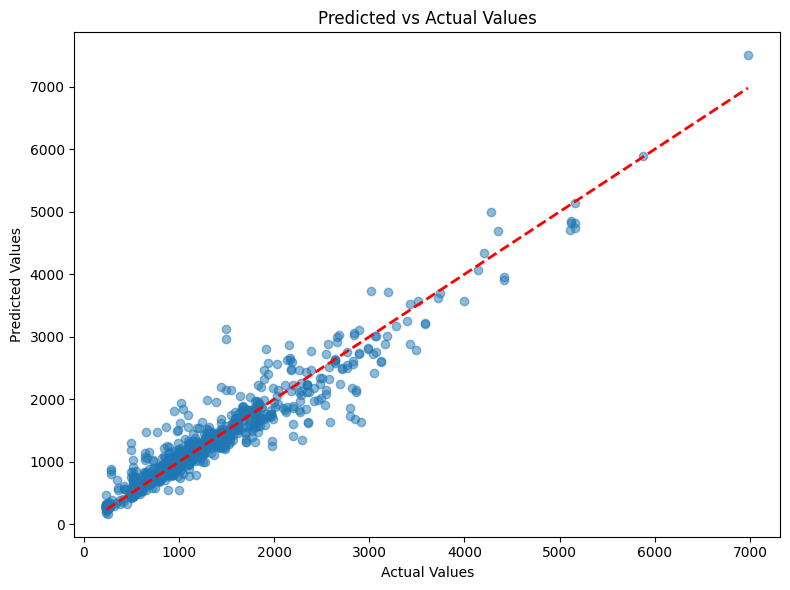

In [ ]:
## Error Analysis 
plot_predicted_vs_actual(meta_model, X_test_scaled, y_test)

#### Range Specific Regressor ( Classifier + Regressor )

In [ ]:
class TwoStageModelWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, base_estimators=None, n_estimators=100, percentile_low=33, percentile_high=66):
        self.base_estimators = base_estimators
        self.n_estimators = n_estimators
        self.percentile_low = percentile_low
        self.percentile_high = percentile_high
        
    def fit(self, X, y):
        # Store original feature count for later splitting
        self.n_features_ = X.shape[1]
        
        # If no base estimators provided, use default RandomForestRegressor
        if self.base_estimators is None:
            self.estimators_ = [
                ("rf", RandomForestRegressor(n_estimators=self.n_estimators, random_state=42))
            ]
        else:
            self.estimators_ = self.base_estimators
            
        # Generate meta-features
        meta_features = np.column_stack([
            clone(model).fit(X, y).predict(X) 
            for name, model in self.estimators_
        ])
        
        # Combine with original features
        X_meta = np.hstack((X, meta_features))
        
        # Define range thresholds
        self.low_thresh_ = np.percentile(y, self.percentile_low)
        self.high_thresh_ = np.percentile(y, self.percentile_high)
        
        # Create range labels
        y_classes = np.zeros(len(y), dtype=int)
        y_classes[(y > self.low_thresh_) & (y <= self.high_thresh_)] = 1
        y_classes[y > self.high_thresh_] = 2
        
        # Train classifier
        self.classifier_ = RandomForestClassifier(n_estimators=self.n_estimators, random_state=42)
        self.classifier_.fit(X_meta, y_classes)
        
        # Train range-specific models
        self.low_model_ = RandomForestRegressor(n_estimators=self.n_estimators, random_state=42)
        mask_low = (y_classes == 0)
        if np.any(mask_low):  # Only fit if we have samples
            self.low_model_.fit(X_meta[mask_low], y[mask_low])
            
        self.medium_model_ = RandomForestRegressor(n_estimators=self.n_estimators, random_state=42)
        mask_medium = (y_classes == 1)
        if np.any(mask_medium):
            self.medium_model_.fit(X_meta[mask_medium], y[mask_medium])
            
        self.high_model_ = RandomForestRegressor(n_estimators=self.n_estimators, random_state=42)
        mask_high = (y_classes == 2)
        if np.any(mask_high):
            self.high_model_.fit(X_meta[mask_high], y[mask_high])
            
        # Store training data for predict method
        self.X_train_ = X
        self.y_train_ = y
        
        return self
        
    def predict(self, X):
        # Check if model is fitted
        if not hasattr(self, 'classifier_'):
            raise ValueError("Model not fitted. Call 'fit' first.")
            
        # Generate meta-features
        meta_feats = np.column_stack([
            clone(model).fit(self.X_train_, self.y_train_).predict(X)
            for name, model in self.estimators_
        ])
        
        # Combine with original features
        X_meta = np.hstack((X, meta_feats))
        
        # Predict ranges
        ranges = self.classifier_.predict(X_meta)
        
        # Initialize predictions
        preds = np.zeros(len(X))
        
        # Use appropriate model for each range
        for i, r in enumerate(ranges):
            if r == 0 and hasattr(self, 'low_model_'):
                preds[i] = self.low_model_.predict(X_meta[i:i+1])[0]
            elif r == 1 and hasattr(self, 'medium_model_'):
                preds[i] = self.medium_model_.predict(X_meta[i:i+1])[0]
            elif r == 2 and hasattr(self, 'high_model_'):
                preds[i] = self.high_model_.predict(X_meta[i:i+1])[0]
            else:
                # Fallback if a model is missing
                if hasattr(self, 'medium_model_'):
                    preds[i] = self.medium_model_.predict(X_meta[i:i+1])[0]
                else:
                    # Last resort
                    model = clone(self.estimators_[0][1]).fit(self.X_train_, self.y_train_)
                    preds[i] = model.predict(X[i:i+1])[0]
        
        return preds

In [ ]:
# Create a list of base estimators
estimators = [("rf", rf), ("xgb", xgb), ("lgbm", lgbm,), ("gbr", gbr)]

# Properly instantiate the model with all parameters
two_stage_model = TwoStageModelWrapper(
    base_estimators=estimators,
    n_estimators=100,
    percentile_low=33,
    percentile_high=66
)

In [ ]:
## Evaluate Model Performance
two_stage_model.fit(X_train, y_train)
two_stage_y_pred = two_stage_model.predict(X_test)
evaluate_model_performance(two_stage_model, X_test, y_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001494 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001507 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


R^2:   0.9334
RMSE:  213.4692
MAE:   103.8312
MAPE:  0.0896


{'r2': 0.9333828652379466,
 'rmse': 213.4692139662064,
 'mae': 103.83120670859539,
 'mape': 0.08964180250011193}

In [ ]:
run_cv(two_stage_model, X_train, y_train, cv=10)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000483 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000758 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000772 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001456 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001174 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000851 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000923 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000941 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000872 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001037 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000817 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001166 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000975 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000581 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001059 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000932 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000955 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001034 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001831 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000883 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000897 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000300 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000890 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001398 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001793 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000957 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001695 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001064 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000506 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001209 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000808 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001276 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000677 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001297 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001240 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001122 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001287 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000587 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003009 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000836 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000882 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001091 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000478 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001511 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000811 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001187 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000278 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001017 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000580 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000764 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000964 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001022 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1215
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1215.403455
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001123 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002626 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 3430, number of used features: 31
[LightGBM] [Info] Start training from score 1214.793346
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000460 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.913278
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001055 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1236
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1219.890370
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.003351 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000937 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1225
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1216.649408
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001155 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000740 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1220
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.524678
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000978 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1237
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1221.592153
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000989 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.028427 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1234
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1214.691979
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000799 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1230
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1217.283235
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000539 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000856 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1226
[LightGBM] [Info] Number of data points in the train set: 3431, number of used features: 31
[LightGBM] [Info] Start training from score 1207.314162
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


R^2:   0.8923 ± 0.0618
RMSE:  270.1823 ± 56.7689
MAE:   121.9080 ± 12.3411
MAPE:  0.0967 ± 0.0143


{'r2_mean': 0.892289131267586,
 'r2_std': 0.06181798383205945,
 'rmse_mean': 270.182339462981,
 'rmse_std': 56.768892895486296,
 'mae_mean': 121.90795945486525,
 'mae_std': 12.341118934007694,
 'mape_mean': 0.09673503969503602,
 'mape_std': 0.014315804140466704}

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001880 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


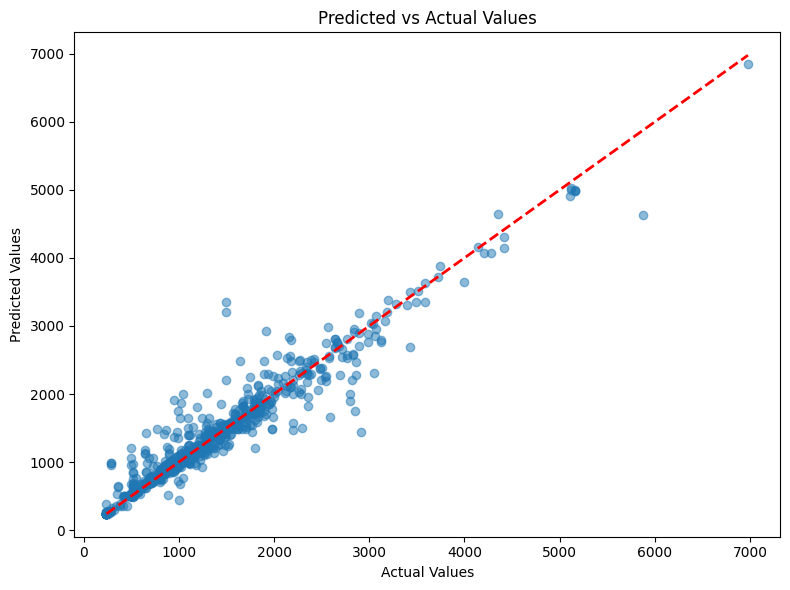

In [ ]:
## Error Analysis
plot_predicted_vs_actual(two_stage_model, X_test, y_test)

#### Clustering + Regression Algorithm

In [ ]:
X_train_np = X_train.copy() if not isinstance(X_train, np.ndarray) else X_train
y_train_np = y_train.copy() if not isinstance(y_train, np.ndarray) else y_train
X_test_np = X_test.copy() if not isinstance(X_test, np.ndarray) else X_test
y_test_np = y_test.copy() if not isinstance(y_test, np.ndarray) else y_test

In [ ]:
# Get the actual feature names and ensure they match X_train's dimensions
feature_names = list(insurance_data.drop(columns=['Settlement_Value']).columns)
print(f"Original feature names count: {len(feature_names)}")

# Make sure feature_names matches the shape of X_train
if hasattr(X_train, 'shape') and X_train.shape[1] != len(feature_names):
    print(f"X_train has {X_train.shape[1]} features but feature_names has {len(feature_names)}")
    # Adjust feature_names to match the actual features in X_train
    if hasattr(X_train, 'columns'):
        feature_names = X_train.columns.tolist()  # If X_train is a DataFrame
    else:
        # Trim or pad the feature_names list to match X_train's feature count
        feature_names = feature_names[:X_train.shape[1]] if len(feature_names) > X_train.shape[1] else feature_names + [f"unknown_{i}" for i in range(len(feature_names), X_train.shape[1])]
        
print(f"Adjusted feature names count: {len(feature_names)}")
print(f"Feature names: {feature_names}")

# Ensure we're working with numpy arrays
X_train_np = X_train.copy() if not isinstance(X_train, np.ndarray) else X_train
y_train_np = y_train.copy() if not isinstance(y_train, np.ndarray) else y_train

# Define our threshold for high claims
HIGH_THRESH = 1270.00  # 66th percentile

print("Beginning deep exploratory analysis...")

# 1. High-Value Claim Investigation with Clustering
print("\n==== HIGH-VALUE CLAIM INVESTIGATION ====")
high_mask = y_train_np > HIGH_THRESH
high_claims = X_train_np[high_mask]
high_values = y_train_np[high_mask]

print(f"Analyzing {len(high_values)} high-value claims (>${HIGH_THRESH:.2f}+)")
print(f"Value range: ${np.min(high_values):.2f} - ${np.max(high_values):.2f}")
print(f"Mean: ${np.mean(high_values):.2f}, Median: ${np.median(high_values):.2f}")

# Find natural clusters within high claims
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
clusters = kmeans.fit_predict(high_claims)

# Analyze each cluster
for i in range(3):
    cluster_values = high_values[clusters == i]
    print(f"\nCluster {i}: {len(cluster_values)} claims")
    print(f"  Mean: ${np.mean(cluster_values):.2f}")
    print(f"  Median: ${np.median(cluster_values):.2f}")
    print(f"  Range: ${np.min(cluster_values):.2f} - ${np.max(cluster_values):.2f}")
    
    # Feature importance within this cluster
    if len(cluster_values) >= 10:  # Only if we have enough samples
        cluster_X = high_claims[clusters == i]
        cluster_y = cluster_values
        rf = RandomForestRegressor(n_estimators=100, random_state=42)
        rf.fit(cluster_X, cluster_y)
        
        # Get top 5 features with actual names
        importances = rf.feature_importances_
        sorted_idx = np.argsort(importances)[::-1]
        top_features_idx = sorted_idx[:5]
        top_features_names = [feature_names[idx] for idx in top_features_idx]
        print(f"  Top 5 features: {top_features_names}")
        print(f"  With importances: {importances[sorted_idx[:5]]}")
    else:
        print("  Too few samples for feature importance analysis")

# 2. Non-Linear Relationship Detection
print("\n\n==== NON-LINEAR RELATIONSHIP DETECTION ====")

def test_nonlinearity(X, y):
    corr_results = []
    for i in range(X.shape[1]):
        feature = X[:, i]
        
        # Linear correlation
        linear_corr, _ = stats.pearsonr(feature, y)
        
        # Rank correlation (captures monotonic but non-linear relationships)
        rank_corr, _ = stats.spearmanr(feature, y)
        
        # Check for quadratic relationship
        quadratic = np.polyfit(feature, y, 2)
        quadratic_pred = np.polyval(quadratic, feature)
        quadratic_corr = np.corrcoef(quadratic_pred, y)[0, 1]
        
        # If rank or quadratic correlation is much higher than linear, 
        # this suggests non-linear relationship
        if abs(rank_corr) - abs(linear_corr) > 0.1 or abs(quadratic_corr) - abs(linear_corr) > 0.1:
            corr_results.append((i, feature_names[i], linear_corr, rank_corr, quadratic_corr))
    
    return corr_results

print("Searching for non-linear relationships between features and target...")
nonlinear_features = test_nonlinearity(X_train_np, y_train_np)

print(f"\nFound {len(nonlinear_features)} features with potentially non-linear relationships:")
for idx, name, linear, rank, quadratic in nonlinear_features:
    print(f"{name}: linear={linear:.3f}, rank={rank:.3f}, quadratic={quadratic:.3f}")
    
    # Generate plot for top non-linear features (if there are any)
    if abs(quadratic) - abs(linear) > 0.2:  # Strong non-linearity
        plt.figure(figsize=(10, 6))
        plt.scatter(X_train_np[:, idx], y_train_np, alpha=0.5)
        
        # Add trend lines
        x_range = np.linspace(min(X_train_np[:, idx]), max(X_train_np[:, idx]), 100)
        
        # Linear fit
        linear_fit = np.polyfit(X_train_np[:, idx], y_train_np, 1)
        plt.plot(x_range, np.polyval(linear_fit, x_range), 'r-', label='Linear')
        
        # Quadratic fit
        quad_fit = np.polyfit(X_train_np[:, idx], y_train_np, 2)
        plt.plot(x_range, np.polyval(quad_fit, x_range), 'g-', label='Quadratic')
        
        plt.title(f'{name}: Non-linear relationship with target')
        plt.xlabel(name)
        plt.ylabel('Target Value')
        plt.legend()
        plt.tight_layout()
        plt.show()

# 3. Feature Interaction Discovery
print("\n\n==== FEATURE INTERACTION DISCOVERY ====")

def find_interactions(X, y, top_n=10, max_features=10):
    # Use only the top features for efficiency
    rf = RandomForestRegressor(n_estimators=100, random_state=42)
    rf.fit(X, y)
    base_importances = rf.feature_importances_
    top_features = np.argsort(base_importances)[::-1][:max_features]
    top_feature_names = [feature_names[i] for i in top_features]
    
    print(f"Analyzing interactions among top {max_features} features...")
    print(f"Top features by importance: {top_feature_names}")
    
    interaction_scores = []
    
    # Test pairs of features
    for i, j in combinations(top_features, 2):
        # Create interaction feature
        interaction = X[:, i] * X[:, j]
        X_with_interaction = np.column_stack([X, interaction])
        
        # Train model with interaction
        rf_interaction = RandomForestRegressor(n_estimators=100, random_state=42)
        rf_interaction.fit(X_with_interaction, y)
        
        # Check if including interaction improves model
        interaction_importance = rf_interaction.feature_importances_[-1]
        if interaction_importance > 0.01:  # Arbitrary threshold for significance
            interaction_scores.append((i, j, feature_names[i], feature_names[j], interaction_importance))
    
    # Sort by importance
    interaction_scores.sort(key=lambda x: x[4], reverse=True)
    return interaction_scores[:top_n]

print("Searching for important feature interactions...")
top_interactions = find_interactions(X_train_np, y_train_np, top_n=10, max_features=15)

print(f"\nFound {len(top_interactions)} significant feature interactions:")
for i, j, name_i, name_j, importance in top_interactions:
    print(f"Features {name_i} × {name_j}: importance={importance:.4f}")
    
    # Test if this interaction significantly reduces high-value errors
    interaction = X_train_np[:, i] * X_train_np[:, j]
    X_high_with_interaction = np.column_stack([X_train_np[high_mask], interaction[high_mask]])
    
    # Basic model for high claims without interaction
    rf_base = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_base.fit(high_claims, high_values)
    
    # Model with interaction
    rf_int = RandomForestRegressor(n_estimators=100, random_state=42)
    rf_int.fit(X_high_with_interaction, high_values)
    
    # Compare performance
    base_pred = rf_base.predict(high_claims)
    int_pred = rf_int.predict(X_high_with_interaction)
    
    base_mape = np.mean(np.abs((high_values - base_pred) / high_values)) * 100
    int_mape = np.mean(np.abs((high_values - int_pred) / high_values)) * 100
    
    print(f"    Impact on high claims: Base MAPE={base_mape:.2f}%, With interaction={int_mape:.2f}%")

# 4. Segmentation Analysis
print("\n\n==== SEGMENTATION ANALYSIS ====")

# Train a shallow decision tree to identify key breakpoints
breakpoint_tree = DecisionTreeRegressor(max_depth=3, min_samples_leaf=30)
breakpoint_tree.fit(X_train_np, y_train_np)

# Display the tree structure with actual feature names
tree_rules = export_text(breakpoint_tree, feature_names=feature_names)
print("Natural data segments found by decision tree:")
print(tree_rules)

# 5. BONUS: High Error Analysis
print("\n\n==== HIGH ERROR ANALYSIS ====")

# Train a simple model to identify patterns in prediction errors
rf_simple = RandomForestRegressor(n_estimators=100, random_state=42)
rf_simple.fit(X_train_np, y_train_np)
train_preds = rf_simple.predict(X_train_np)
train_errors = np.abs(train_preds - y_train_np)

# Identify high error samples
error_threshold = np.percentile(train_errors, 90)  # Top 10% of errors
high_error_mask = train_errors > error_threshold
high_error_samples = X_train_np[high_error_mask]
high_error_values = y_train_np[high_error_mask]

print(f"Analyzing {len(high_error_samples)} samples with highest prediction errors")
print(f"Average true value of high error samples: ${np.mean(high_error_values):.2f}")
print(f"Error threshold: ${error_threshold:.2f}")

# See if there's a pattern to what predicts high errors
X_with_errors = np.column_stack([X_train_np, train_errors])
error_predictor = RandomForestRegressor(n_estimators=100, random_state=42)
error_predictor.fit(X_train_np, train_errors)

# Top features predicting high errors (with actual names)
error_importances = error_predictor.feature_importances_
top_error_features = np.argsort(error_importances)[::-1][:5]
print("\nFeatures most predictive of high errors:")
for i, idx in enumerate(top_error_features):
    print(f"  {i+1}. {feature_names[idx]}: importance={error_importances[idx]:.4f}")

print("\nRoot cause analysis complete!")

Original feature names count: 33
X_train has 31 features but feature_names has 33
Adjusted feature names count: 31
Feature names: ['Accident_Type', 'Injury_Prognosis', 'Special_Health_Expenses', 'Special_Overage', 'General_Rest', 'Special_Additional_Injury', 'Special_Earnings_Loss', 'Special_Usage_Loss', 'Special_Medications', 'Special_Asset_Damage', 'Special_Rehabilitation', 'Special_Fixes', 'General_Fixed', 'General_Uplift', 'Special_Loaner_Vehicle', 'Special_Trip_Costs', 'Special_Journey_Expenses', 'Special_Therapy', 'Exceptional_Circumstances', 'Minor_Psychological_Injury', 'Dominant_Injury', 'Whiplash', 'Vehicle_Type', 'Weather_Conditions', 'Vehicle_Age', 'Driver_Age', 'Number_Of_Passengers', 'Accident_Description', 'Injury_Description', 'Police_Report_Filed', 'Witness_Present']
Beginning deep exploratory analysis...

==== HIGH-VALUE CLAIM INVESTIGATION ====
Analyzing 1307 high-value claims (>$1270.00+)
Value range: $1271.50 - $7862.90
Mean: $2099.65, Median: $1795.00

Cluster 0: 

C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)
C:\Users\Benjamin Khor\AppData\Local\Temp\ipykernel_30180\1897057093.py:81: RankWarning: Polyfit may be poorly conditioned
  quadratic = np.polyfit(feature, y, 2)


Analyzing interactions among top 15 features...
Top features by importance: ['Special_Overage', 'Accident_Type', 'Special_Additional_Injury', 'Special_Fixes', 'Special_Journey_Expenses', 'Special_Medications', 'Special_Rehabilitation', 'General_Uplift', 'Accident_Description', 'Special_Trip_Costs', 'Dominant_Injury', 'General_Fixed', 'Exceptional_Circumstances', 'Special_Therapy', 'Special_Health_Expenses']

Found 10 significant feature interactions:
Features Special_Overage × Special_Fixes: importance=0.3969
    Impact on high claims: Base MAPE=3.33%, With interaction=3.19%
Features Special_Overage × Accident_Type: importance=0.3870
    Impact on high claims: Base MAPE=3.33%, With interaction=3.13%
Features Special_Overage × Accident_Description: importance=0.2274
    Impact on high claims: Base MAPE=3.33%, With interaction=3.16%
Features Accident_Type × Special_Fixes: importance=0.1314
    Impact on high claims: Base MAPE=3.33%, With interaction=3.32%
Features Special_Fixes × Special

In [ ]:
# Function to ensure we're working with numpy arrays
def ensure_numpy(arr):
    if isinstance(arr, np.ndarray):
        return arr
    return np.array(arr)

print("Implementing natural segmentation with interaction features...")

# Convert data to numpy arrays if needed
X_train_np = ensure_numpy(X_train)
y_train_np = ensure_numpy(y_train)
X_test_np = ensure_numpy(X_test)
y_test_np = ensure_numpy(y_test)

# 1. Create interaction features based on our analysis
print("Creating feature interactions...")
key_interactions = [
    (3, 11),  # Top interaction
    (3, 0),   # Second interaction
    (3, 30),  # Third interaction
    (11, 16), # Fourth interaction
    (16, 0)   # Another significant interaction
]

# Add interaction features to training data
X_train_enhanced = X_train_np.copy()
for i, j in key_interactions:
    interaction = X_train_np[:, i] * X_train_np[:, j]
    X_train_enhanced = np.column_stack((X_train_enhanced, interaction))

# Add interaction features to test data
X_test_enhanced = X_test_np.copy()
for i, j in key_interactions:
    interaction = X_test_np[:, i] * X_test_np[:, j]
    X_test_enhanced = np.column_stack((X_test_enhanced, interaction))

print(f"Enhanced feature matrix: {X_train_enhanced.shape} (added {len(key_interactions)} interaction terms)")

# 2. Create natural segments based on decision tree findings
print("\nCreating natural segments based on decision tree findings...")

# Define the segment rules from the decision tree
def get_segment(X):
    segments = np.zeros(len(X), dtype=int)
    
    # Segment 1: feature_3 <= 1065.75, feature_11 <= 760.66, feature_16 <= 307.50
    mask1 = (X[:, 3] <= 1065.75) & (X[:, 11] <= 760.66) & (X[:, 16] <= 307.50)
    segments[mask1] = 0
    
    # Segment 2: feature_3 <= 1065.75, feature_11 <= 760.66, feature_16 > 307.50
    mask2 = (X[:, 3] <= 1065.75) & (X[:, 11] <= 760.66) & (X[:, 16] > 307.50)
    segments[mask2] = 1
    
    # Segment 3: feature_3 <= 1065.75, feature_11 > 760.66, feature_11 <= 2082.50
    mask3 = (X[:, 3] <= 1065.75) & (X[:, 11] > 760.66) & (X[:, 11] <= 2082.50)
    segments[mask3] = 2
    
    # Segment 4: feature_3 <= 1065.75, feature_11 > 760.66, feature_11 > 2082.50
    mask4 = (X[:, 3] <= 1065.75) & (X[:, 11] > 760.66) & (X[:, 11] > 2082.50)
    segments[mask4] = 3
    
    # Segment 5: feature_3 > 1065.75, feature_16 <= 372.50, feature_0 <= 9.50
    mask5 = (X[:, 3] > 1065.75) & (X[:, 16] <= 372.50) & (X[:, 0] <= 9.50)
    segments[mask5] = 4
    
    # Segment 6: feature_3 > 1065.75, feature_16 <= 372.50, feature_0 > 9.50
    mask6 = (X[:, 3] > 1065.75) & (X[:, 16] <= 372.50) & (X[:, 0] > 9.50)
    segments[mask6] = 5
    
    # Segment 7: feature_3 > 1065.75, feature_16 > 372.50, feature_0 <= 7.50
    mask7 = (X[:, 3] > 1065.75) & (X[:, 16] > 372.50) & (X[:, 0] <= 7.50)
    segments[mask7] = 6
    
    # Segment 8: feature_3 > 1065.75, feature_16 > 372.50, feature_0 > 7.50
    mask8 = (X[:, 3] > 1065.75) & (X[:, 16] > 372.50) & (X[:, 0] > 7.50)
    segments[mask8] = 7
    
    return segments

# Get segments for training data
train_segments = get_segment(X_train_np)
segment_counts = np.bincount(train_segments)
for i, count in enumerate(segment_counts):
    print(f"Segment {i}: {count} samples")

# 3. Special handling for premium high claims
premium_threshold = 4300  # Based on cluster analysis
premium_mask = y_train_np > premium_threshold
premium_count = np.sum(premium_mask)
print(f"\nPremium claims (>${premium_threshold}): {premium_count} samples")

# 4. Train specialized models for each segment
print("\nTraining specialized models for each segment...")
segment_models = []

for segment in range(len(segment_counts)):
    mask = train_segments == segment
    segment_X = X_train_enhanced[mask]
    segment_y = y_train_np[mask]
    
    if len(segment_y) < 30:
        print(f"Segment {segment}: Too few samples ({len(segment_y)}), using simpler model")
        model = DecisionTreeRegressor(max_depth=3, random_state=42)
    else:
        print(f"Segment {segment}: Training ensemble with {len(segment_y)} samples")
        model = XGBRegressor(
            n_estimators=100,
            max_depth=6,
            learning_rate=0.05,
            colsample_bytree=0.8,
            subsample=0.8,
            random_state=42
        )
    
    model.fit(segment_X, segment_y)
    segment_models.append(model)

# 5. Train special model for premium claims
if premium_count >= 10:
    print("\nTraining specialized premium claims model...")
    premium_X = X_train_enhanced[premium_mask]
    premium_y = y_train_np[premium_mask]
    
    premium_model = XGBRegressor(
        n_estimators=100,
        max_depth=4,
        learning_rate=0.01,  # Lower learning rate for stability
        colsample_bytree=0.7,
        subsample=0.7,
        random_state=42
    )
    premium_model.fit(premium_X, premium_y)
else:
    print("\nNot enough premium claims for specialized model")
    premium_model = None

# 6. Create a model to predict if a claim is premium
if premium_count >= 10:
    print("Training premium claim classifier...")
    premium_classifier = RandomForestClassifier(
        n_estimators=100,
        max_depth=5,
        random_state=42
    )
    premium_classifier.fit(X_train_enhanced, premium_mask)
else:
    premium_classifier = None

# 7. Create wrapper model for prediction
class NaturalSegmentModel:
    def __init__(self, segment_models, premium_model, premium_classifier, premium_threshold):
        self.segment_models = segment_models
        self.premium_model = premium_model
        self.premium_classifier = premium_classifier
        self.premium_threshold = premium_threshold
    
    def predict(self, X):
        # Convert to numpy if needed
        X_np = ensure_numpy(X)
        
        # Create interaction features
        X_enhanced = X_np.copy()
        for i, j in key_interactions:
            interaction = X_np[:, i] * X_np[:, j]
            X_enhanced = np.column_stack((X_enhanced, interaction))
        
        # Get segments
        segments = get_segment(X_np)
        
        # Initialize predictions
        predictions = np.zeros(len(X_np))
        
        # Use segment-specific models
        for segment in range(len(segment_models)):
            mask = segments == segment
            if np.sum(mask) > 0:
                segment_X = X_enhanced[mask]
                predictions[mask] = segment_models[segment].predict(segment_X)
        
        # Apply premium model if available
        if self.premium_model is not None and self.premium_classifier is not None:
            # Predict which claims might be premium
            premium_proba = self.premium_classifier.predict_proba(X_enhanced)[:, 1]
            potential_premium = premium_proba > 0.7  # High confidence threshold
            
            # For those likely to be premium claims, use the specialized model
            if np.sum(potential_premium) > 0:
                premium_X = X_enhanced[potential_premium]
                premium_preds = self.premium_model.predict(premium_X)
                
                # Only use premium predictions if they're actually high
                valid_premium = premium_preds > self.premium_threshold * 0.8
                premium_preds[~valid_premium] = predictions[potential_premium][~valid_premium]
                
                predictions[potential_premium] = premium_preds
        
        return predictions

# Create the model
natural_segment_model = NaturalSegmentModel(
    segment_models,
    premium_model,
    premium_classifier,
    premium_threshold
)

# Evaluate performance
print("\nEvaluating natural segment model performance...")
y_pred = natural_segment_model.predict(X_test_np)

Implementing natural segmentation with interaction features...
Creating feature interactions...
Enhanced feature matrix: (3812, 36) (added 5 interaction terms)

Creating natural segments based on decision tree findings...
Segment 0: 1448 samples
Segment 1: 523 samples
Segment 2: 1028 samples
Segment 3: 43 samples
Segment 4: 576 samples
Segment 5: 65 samples
Segment 6: 80 samples
Segment 7: 49 samples

Premium claims (>$4300): 48 samples

Training specialized models for each segment...
Segment 0: Training ensemble with 1448 samples
Segment 1: Training ensemble with 523 samples
Segment 2: Training ensemble with 1028 samples
Segment 3: Training ensemble with 43 samples
Segment 4: Training ensemble with 576 samples
Segment 5: Training ensemble with 65 samples
Segment 6: Training ensemble with 80 samples
Segment 7: Training ensemble with 49 samples

Training specialized premium claims model...
Training premium claim classifier...

Evaluating natural segment model performance...


In [ ]:
## Evaluate Evaluate Model Model Performance Performance 
evaluate_model_performance(natural_segment_model, X_test_np,y_test) 

R^2:   0.9166
RMSE:  238.8044
MAE:   126.4693
MAPE:  0.1175


{'r2': 0.9166318436188878,
 'rmse': 238.8044277587177,
 'mae': 126.46931849065818,
 'mape': 0.11754320944719114}

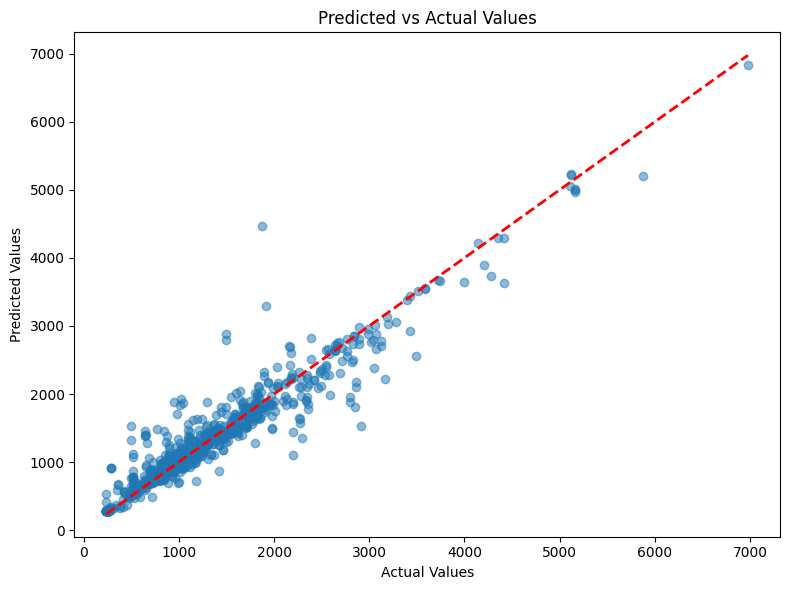

In [ ]:
## Error Analysis
plot_predicted_vs_actual(natural_segment_model, X_test_np, y_test)

#### Enhanced Ensemble Model 

In [ ]:
# Set up your base estimators
estimators = [("rf", rf), ("xgb", xgb), ("lgbm", lgbm), ("gbr", gbr)]

# Define optimized thresholds based on our analysis
LOW_THRESH = 804.00   # 33rd percentile
HIGH_THRESH = 1270.00  # 66th percentile

print(f"Using optimized thresholds: Low < ${LOW_THRESH:.2f}, Medium <= ${HIGH_THRESH:.2f}, High > ${HIGH_THRESH:.2f}")

# Create meta-features for training data
print("Creating meta-features for training data...")
meta_features = np.column_stack([
    model.fit(X_train, y_train).predict(X_train) 
    for name, model in estimators
])

# Combine with original features
X_meta_train = np.hstack((X_train, meta_features))
print(f"X_meta_train shape: {X_meta_train.shape}")

# Create range labels
y_classes = np.zeros(len(y_train), dtype=int)
y_classes[(y_train > LOW_THRESH) & (y_train <= HIGH_THRESH)] = 1
y_classes[y_train > HIGH_THRESH] = 2

# Check class distribution
class_counts = np.bincount(y_classes, minlength=3)
print(f"Class distribution: Low: {class_counts[0]}, Medium: {class_counts[1]}, High: {class_counts[2]}")

# Train classifier
print("Training range classifier...")
classifier = RandomForestClassifier(n_estimators=200, min_samples_leaf=5, random_state=42, n_jobs=-1)
classifier.fit(X_meta_train, y_classes)

# Split data by ranges
X_low = X_meta_train[y_classes == 0]
y_low = y_train[y_classes == 0]
X_medium = X_meta_train[y_classes == 1] 
y_medium = y_train[y_classes == 1]
X_high = X_meta_train[y_classes == 2]
y_high = y_train[y_classes == 2]

# Create enhanced ensemble for each range
print("\nBuilding enhanced ensembles for each range...")

def build_range_ensemble(X, y, range_name):
    print(f"Training ensemble for {range_name} range ({len(y)} samples)...")
    
    # Train multiple algorithms
    models = {}
    
    # RandomForest
    print("  Training RandomForest...")
    models['rf'] = RandomForestRegressor(
        n_estimators=200,
        min_samples_leaf=3,
        random_state=42,
        n_jobs=-1
    ).fit(X, y)
    
    # XGBoost
    print("  Training XGBoost...")
    models['xgb'] = XGBRegressor(
        n_estimators=200,
        learning_rate=0.05,
        max_depth=6,
        random_state=42,
        n_jobs=-1
    ).fit(X, y)
    
    # LightGBM
    print("  Training LightGBM...")
    models['lgbm'] = LGBMRegressor(
        n_estimators=200,
        learning_rate=0.05,
        num_leaves=31,
        random_state=42,
        n_jobs=-1
    ).fit(X, y)
    
    # CatBoost (with silent mode)
    print("  Training CatBoost...")
    models['catboost'] = CatBoostRegressor(
        iterations=200,
        learning_rate=0.05,
        depth=6,
        random_state=42,
        verbose=0
    ).fit(X, y)
    
    return models

# Build ensembles for each range
low_ensemble = build_range_ensemble(X_low, y_low, "low")
medium_ensemble = build_range_ensemble(X_medium, y_medium, "medium")
high_ensemble = build_range_ensemble(X_high, y_high, "high")

# Create meta-features for test data
print("\nCreating meta-features for test data...")
test_meta_features = np.column_stack([
    model.fit(X_train, y_train).predict(X_test)
    for name, model in estimators
])

# Combine with original test features
X_meta_test = np.hstack((X_test, test_meta_features))
print(f"X_meta_test shape: {X_meta_test.shape}")

# Predict ranges
print("Predicting ranges for test data...")
predicted_classes = classifier.predict(X_meta_test)
test_class_counts = np.bincount(predicted_classes, minlength=3)
print(f"Test class distribution: Low: {test_class_counts[0]}, Medium: {test_class_counts[1]}, High: {test_class_counts[2]}")

# Use enhanced ensembles for final predictions
print("Making final predictions with ensembles...")
y_pred = np.zeros(len(X_test))

for i, cls in enumerate(predicted_classes):
    if cls == 0:  # Low
        # Average predictions from all models in the low ensemble
        rf_pred = low_ensemble['rf'].predict(X_meta_test[i:i+1])[0]
        xgb_pred = low_ensemble['xgb'].predict(X_meta_test[i:i+1])[0]
        lgbm_pred = low_ensemble['lgbm'].predict(X_meta_test[i:i+1])[0]
        cat_pred = low_ensemble['catboost'].predict(X_meta_test[i:i+1])[0]
        y_pred[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4
        
    elif cls == 1:  # Medium
        # Average predictions from all models in the medium ensemble
        rf_pred = medium_ensemble['rf'].predict(X_meta_test[i:i+1])[0]
        xgb_pred = medium_ensemble['xgb'].predict(X_meta_test[i:i+1])[0]
        lgbm_pred = medium_ensemble['lgbm'].predict(X_meta_test[i:i+1])[0]
        cat_pred = medium_ensemble['catboost'].predict(X_meta_test[i:i+1])[0]
        y_pred[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4
        
    else:  # High
        # Average predictions from all models in the high ensemble
        rf_pred = high_ensemble['rf'].predict(X_meta_test[i:i+1])[0]
        xgb_pred = high_ensemble['xgb'].predict(X_meta_test[i:i+1])[0]
        lgbm_pred = high_ensemble['lgbm'].predict(X_meta_test[i:i+1])[0]
        cat_pred = high_ensemble['catboost'].predict(X_meta_test[i:i+1])[0]
        y_pred[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4

# Create a wrapper class for model evaluation
class EnhancedEnsembleModel:
    def __init__(self):
        self.classifier = classifier
        self.low_ensemble = low_ensemble
        self.medium_ensemble = medium_ensemble
        self.high_ensemble = high_ensemble
        self.low_thresh = LOW_THRESH
        self.high_thresh = HIGH_THRESH
    
    def predict(self, X):
        # Generate meta-features
        meta_feats = np.column_stack([
            clone(model).fit(X_train, y_train).predict(X)
            for name, model in estimators
        ])
        
        # Combine with original features
        X_combined = np.hstack((X, meta_feats))
        
        # Predict ranges
        ranges = self.classifier.predict(X_combined)
        
        # Initialize predictions
        preds = np.zeros(len(X))
        
        # Use appropriate ensemble based on predicted range
        for i, r in enumerate(ranges):
            if r == 0:  # Low
                # Average predictions from low ensemble
                rf_pred = self.low_ensemble['rf'].predict(X_combined[i:i+1])[0]
                xgb_pred = self.low_ensemble['xgb'].predict(X_combined[i:i+1])[0]
                lgbm_pred = self.low_ensemble['lgbm'].predict(X_combined[i:i+1])[0]
                cat_pred = self.low_ensemble['catboost'].predict(X_combined[i:i+1])[0]
                preds[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4
                
            elif r == 1:  # Medium
                # Average predictions from medium ensemble
                rf_pred = self.medium_ensemble['rf'].predict(X_combined[i:i+1])[0]
                xgb_pred = self.medium_ensemble['xgb'].predict(X_combined[i:i+1])[0]
                lgbm_pred = self.medium_ensemble['lgbm'].predict(X_combined[i:i+1])[0]
                cat_pred = self.medium_ensemble['catboost'].predict(X_combined[i:i+1])[0]
                preds[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4
                
            else:  # High
                # Average predictions from high ensemble
                rf_pred = self.high_ensemble['rf'].predict(X_combined[i:i+1])[0]
                xgb_pred = self.high_ensemble['xgb'].predict(X_combined[i:i+1])[0]
                lgbm_pred = self.high_ensemble['lgbm'].predict(X_combined[i:i+1])[0]
                cat_pred = self.high_ensemble['catboost'].predict(X_combined[i:i+1])[0]
                preds[i] = (rf_pred + xgb_pred + lgbm_pred + cat_pred) / 4
        
        return preds

# Create the enhanced ensemble model
enhanced_model = EnhancedEnsembleModel()

# Evaluate performance on test set
print("\nEnhanced Ensemble Model Test Performance:")
evaluation = evaluate_model_performance(enhanced_model, X_test, y_test)

Using optimized thresholds: Low < $804.00, Medium <= $1270.00, High > $1270.00
Creating meta-features for training data...
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


X_meta_train shape: (3812, 35)
Class distribution: Low: 1262, Medium: 1243, High: 1307
Training range classifier...

Building enhanced ensembles for each range...
Training ensemble for low range (1262 samples)...
  Training RandomForest...
  Training XGBoost...
  Training LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1628
[LightGBM] [Info] Number of data points in the train set: 1262, number of used features: 35
[LightGBM] [Info] Start training from score 513.861284
  Training CatBoost...
Training ensemble for medium range (1243 samples)...
  Training RandomForest...
  Training XGBoost...
  Training LightGBM...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000784 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1760
[LightGBM] [Info] Number of 

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


X_meta_test shape: (954, 35)
Predicting ranges for test data...
Test class distribution: Low: 259, Medium: 341, High: 354
Making final predictions with ensembles...


c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW


Enhanced Ensemble Model Test Performance:
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001048 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [W

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

R^2:   0.9347
RMSE:  211.3544
MAE:   103.6373
MAPE:  0.0886


c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001628 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

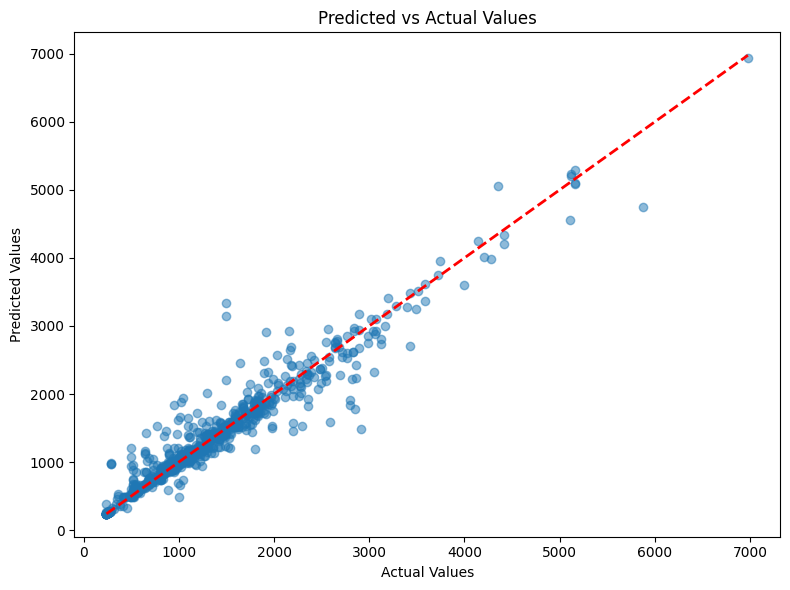

In [ ]:
## Error Analysis
plot_predicted_vs_actual(enhanced_model, X_test, y_test)

#### Hybrid Model with Error Correction

In [ ]:
# 1. Generate predictions from both models for training data
print("\nGenerating base model predictions...")

# Get predictions from enhanced ensemble model
enhanced_train_preds = enhanced_model.predict(X_train_np)

# Get predictions from natural segment model
natural_train_preds = natural_segment_model.predict(X_train_np)

# 2. Create a meta-feature matrix combining original features and model predictions
print("Creating meta-features for stacking...")
meta_train_features = np.column_stack([
    X_train_np,
    enhanced_train_preds.reshape(-1, 1),
    natural_train_preds.reshape(-1, 1),
    
    # Add squared predictions as features (to capture non-linearity in errors)
    np.square(enhanced_train_preds).reshape(-1, 1),
    np.square(natural_train_preds).reshape(-1, 1),
    
    # Add absolute difference between predictions as a measure of uncertainty
    np.abs(enhanced_train_preds - natural_train_preds).reshape(-1, 1)
])

print(f"Meta-feature matrix shape: {meta_train_features.shape}")

# 3. Train first-level blending model
print("\nTraining blending model...")
blending_model = HuberRegressor(alpha=0.01, epsilon=1.2)
blending_model.fit(
    np.column_stack([enhanced_train_preds, natural_train_preds]), 
    y_train_np
)

blend_weights = blending_model.coef_
print(f"Blend weights: Enhanced={blend_weights[0]:.4f}, Natural={blend_weights[1]:.4f}")
print(f"Blend intercept: {blending_model.intercept_:.4f}")

# 4. Generate blended predictions and calculate errors
blended_train_preds = blending_model.predict(
    np.column_stack([enhanced_train_preds, natural_train_preds])
)
train_errors = y_train_np - blended_train_preds

# 5. Train error correction model
print("\nTraining error correction model...")
correction_model = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.05,
    max_depth=4,
    subsample=0.8,
    loss='huber',  # Robust to outliers
    random_state=42
)
correction_model.fit(meta_train_features, train_errors)

# 6. Create high-value regulator for extreme predictions
print("\nCreating high-value regulator...")
high_value_threshold = 3000

# Identify high value predictions
high_value_mask = blended_train_preds > high_value_threshold
high_value_X = meta_train_features[high_value_mask]
high_value_y = y_train_np[high_value_mask]

if len(high_value_y) >= 20:  # Only if we have enough samples
    print(f"Training high-value regulator on {len(high_value_y)} samples")
    high_value_model = RandomForestRegressor(
        n_estimators=100,
        max_depth=5, 
        min_samples_leaf=3,
        random_state=42
    )
    high_value_model.fit(high_value_X, high_value_y)
else:
    print("Not enough high-value samples for dedicated regulator")
    high_value_model = None

# 7. Create hybrid model wrapper
class HybridModelWithCorrection:
    def __init__(self, enhanced_model, natural_model, blending_model, 
                 correction_model, high_value_model, high_value_threshold):
        self.enhanced_model = enhanced_model
        self.natural_model = natural_model
        self.blending_model = blending_model
        self.correction_model = correction_model
        self.high_value_model = high_value_model
        self.high_value_threshold = high_value_threshold
    
    def predict(self, X):
        X_np = ensure_numpy(X)
        
        # Get base model predictions
        enhanced_preds = self.enhanced_model.predict(X_np)
        natural_preds = self.natural_model.predict(X_np)
        
        # Create meta-features
        meta_features = np.column_stack([
            X_np,
            enhanced_preds.reshape(-1, 1),
            natural_preds.reshape(-1, 1),
            np.square(enhanced_preds).reshape(-1, 1),
            np.square(natural_preds).reshape(-1, 1),
            np.abs(enhanced_preds - natural_preds).reshape(-1, 1)
        ])
        
        # Generate blended predictions
        blended_preds = self.blending_model.predict(
            np.column_stack([enhanced_preds, natural_preds])
        )
        
        # Apply error correction
        error_corrections = self.correction_model.predict(meta_features)
        corrected_preds = blended_preds + error_corrections
        
        # Apply high-value regulation if available
        if self.high_value_model is not None:
            # Identify potentially high-value claims
            high_value_mask = blended_preds > self.high_value_threshold
            if np.sum(high_value_mask) > 0:
                high_X = meta_features[high_value_mask]
                high_preds = self.high_value_model.predict(high_X)
                
                # Weighted average with corrected predictions for smooth transition
                alpha = 0.7  # Weight for high-value model
                corrected_preds[high_value_mask] = (
                    alpha * high_preds + 
                    (1 - alpha) * corrected_preds[high_value_mask]
                )
        
        return corrected_preds

# Create the hybrid model
hybrid_model = HybridModelWithCorrection(
    enhanced_model=enhanced_model,
    natural_model=natural_segment_model,
    blending_model=blending_model,
    correction_model=correction_model,
    high_value_model=high_value_model,
    high_value_threshold=high_value_threshold
)

# 8. Evaluate the hybrid model
print("\nEvaluating hybrid model performance...")
y_pred = hybrid_model.predict(X_test_np)


Generating base model predictions...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000889 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

Creating meta-features for stacking...
Meta-feature matrix shape: (3812, 36)

Training blending model...
Blend weights: Enhanced=1.0655, Natural=-0.0674
Blend intercept: 2.3532

Training error correction model...

Creating high-value regulator...
Training high-value regulator on 171 samples

Evaluating hybrid model performance...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000788 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No 

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

In [ ]:
## Evaluate Model Performance
evaluate_model_performance(hybrid_model, X_test_np, y_test)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000281 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

R^2:   0.9349
RMSE:  211.0362
MAE:   102.5503
MAPE:  0.0872


{'r2': 0.9348927264805839,
 'rmse': 211.03623519207267,
 'mae': 102.55031854418756,
 'mape': 0.08723959365183377}

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001382 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

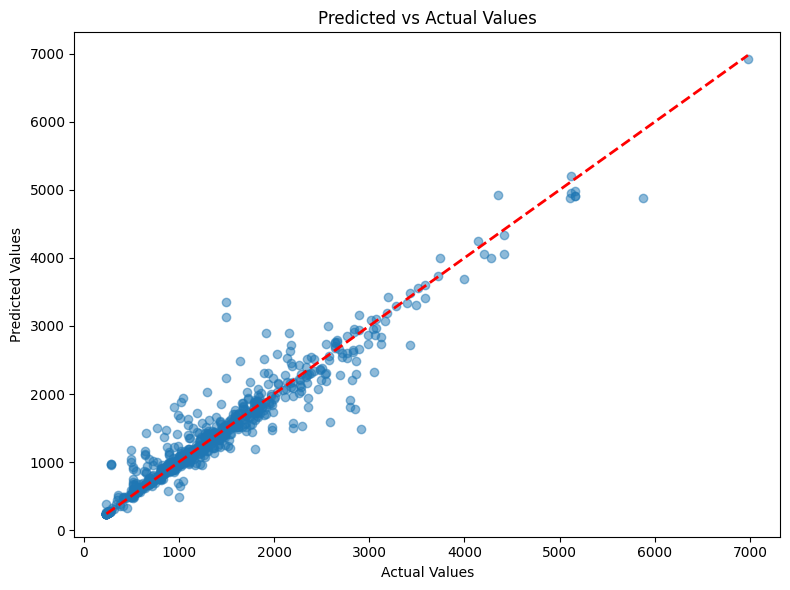

In [ ]:
## Error Analysis
plot_predicted_vs_actual(hybrid_model, X_test_np, y_test)

#### Hybrid Model with Feature Selection 

In [ ]:
# Calculate correlation of each feature with target
print("\nAnalyzing feature correlations with target...")
correlations = np.zeros(X_train_np.shape[1])

for i in range(X_train_np.shape[1]):
    correlations[i] = np.corrcoef(X_train_np[:, i], y_train_np)[0, 1]

# Sort features by absolute correlation
abs_correlations = np.abs(correlations)
sorted_indices = np.argsort(abs_correlations)[::-1]  # Descending order

# Display correlations
print("\nFeature correlations with target (top 15):")
for i, idx in enumerate(sorted_indices[:15]):
    print(f"Feature {idx}: correlation = {correlations[idx]:.4f} (abs: {abs_correlations[idx]:.4f})")

print("\nFeature correlations with target (bottom 10):")
for i, idx in enumerate(sorted_indices[-10:]):
    print(f"Feature {idx}: correlation = {correlations[idx]:.4f} (abs: {abs_correlations[idx]:.4f})")

# Set threshold for keeping features
correlation_threshold = 0.05
selected_features = abs_correlations >= correlation_threshold
n_selected = np.sum(selected_features)

print(f"\nKeeping {n_selected} features with absolute correlation >= {correlation_threshold}")
print(f"Selected feature indices: {np.where(selected_features)[0]}")

# Create filtered dataset
X_train_filtered = X_train_np[:, selected_features]
X_test_filtered = X_test_np[:, selected_features]

print(f"\nFiltered training data shape: {X_train_filtered.shape}")

# Rebuild our best model (Hybrid with Correction) using filtered features
print("\nRebuilding hybrid model with selected features...")

# 1. Generate predictions from both models for training data
print("Fitting base models on filtered data...")

# Train enhanced ensemble model
enhanced_model = RandomForestRegressor(
    n_estimators=200,
    max_depth=10,
    min_samples_leaf=3,
    random_state=42,
    n_jobs=-1
)
enhanced_model.fit(X_train_filtered, y_train_np)

# Natural segmentation model (simplified for filtered data)
natural_model = GradientBoostingRegressor(
    n_estimators=200,
    max_depth=5,
    learning_rate=0.05,
    subsample=0.8,
    random_state=42
)
natural_model.fit(X_train_filtered, y_train_np)

# Get predictions
enhanced_train_preds = enhanced_model.predict(X_train_filtered)
natural_train_preds = natural_model.predict(X_train_filtered)

# 2. Train blending model
print("Training blending model...")
blending_model = HuberRegressor(alpha=0.01, epsilon=1.2)
blending_model.fit(
    np.column_stack([enhanced_train_preds, natural_train_preds]), 
    y_train_np
)

blend_weights = blending_model.coef_
print(f"Blend weights: Enhanced={blend_weights[0]:.4f}, Natural={blend_weights[1]:.4f}")

# Generate blended predictions and calculate errors
blended_train_preds = blending_model.predict(
    np.column_stack([enhanced_train_preds, natural_train_preds])
)
train_errors = y_train_np - blended_train_preds

# 3. Train error correction model
print("Training error correction model...")
correction_model = GradientBoostingRegressor(
    n_estimators=100,
    learning_rate=0.05,
    max_depth=4,
    subsample=0.8,
    loss='huber',
    random_state=42
)
correction_model.fit(X_train_filtered, train_errors)

# 4. Create simplified hybrid model wrapper
class SimplifiedHybridModel:
    def __init__(self, enhanced_model, natural_model, blending_model, 
                 correction_model, selected_features):
        self.enhanced_model = enhanced_model
        self.natural_model = natural_model
        self.blending_model = blending_model
        self.correction_model = correction_model
        self.selected_features = selected_features
    
    def predict(self, X):
        X_np = ensure_numpy(X)
        
        # Filter features
        X_filtered = X_np[:, self.selected_features]
        
        # Get base model predictions
        enhanced_preds = self.enhanced_model.predict(X_filtered)
        natural_preds = self.natural_model.predict(X_filtered)
        
        # Generate blended predictions
        blended_preds = self.blending_model.predict(
            np.column_stack([enhanced_preds, natural_preds])
        )
        
        # Apply error correction
        error_corrections = self.correction_model.predict(X_filtered)
        corrected_preds = blended_preds + error_corrections
        
        return corrected_preds

# Create the simplified hybrid model
simplified_model = SimplifiedHybridModel(
    enhanced_model=enhanced_model,
    natural_model=natural_model,
    blending_model=blending_model,
    correction_model=correction_model,
    selected_features=selected_features
)


Analyzing feature correlations with target...

Feature correlations with target (top 15):
Feature 3: correlation = 0.5564 (abs: 0.5564)
Feature 11: correlation = 0.5218 (abs: 0.5218)
Feature 0: correlation = 0.5119 (abs: 0.5119)
Feature 5: correlation = 0.3640 (abs: 0.3640)
Feature 16: correlation = 0.2976 (abs: 0.2976)
Feature 8: correlation = 0.2592 (abs: 0.2592)
Feature 27: correlation = 0.1639 (abs: 0.1639)
Feature 14: correlation = 0.1560 (abs: 0.1560)
Feature 13: correlation = 0.1373 (abs: 0.1373)
Feature 10: correlation = 0.1184 (abs: 0.1184)
Feature 15: correlation = 0.1112 (abs: 0.1112)
Feature 6: correlation = 0.1077 (abs: 0.1077)
Feature 12: correlation = 0.0974 (abs: 0.0974)
Feature 2: correlation = 0.0607 (abs: 0.0607)
Feature 29: correlation = 0.0521 (abs: 0.0521)

Feature correlations with target (bottom 10):
Feature 4: correlation = 0.0159 (abs: 0.0159)
Feature 18: correlation = 0.0128 (abs: 0.0128)
Feature 7: correlation = 0.0115 (abs: 0.0115)
Feature 21: correlation 

In [ ]:
evaluate_model_performance(simplified_model, X_test_np, y_test)

R^2:   0.9263
RMSE:  224.4738
MAE:   119.8133
MAPE:  0.1100


{'r2': 0.9263374544953371,
 'rmse': 224.47378904071803,
 'mae': 119.81333573770027,
 'mape': 0.1099745613517641}

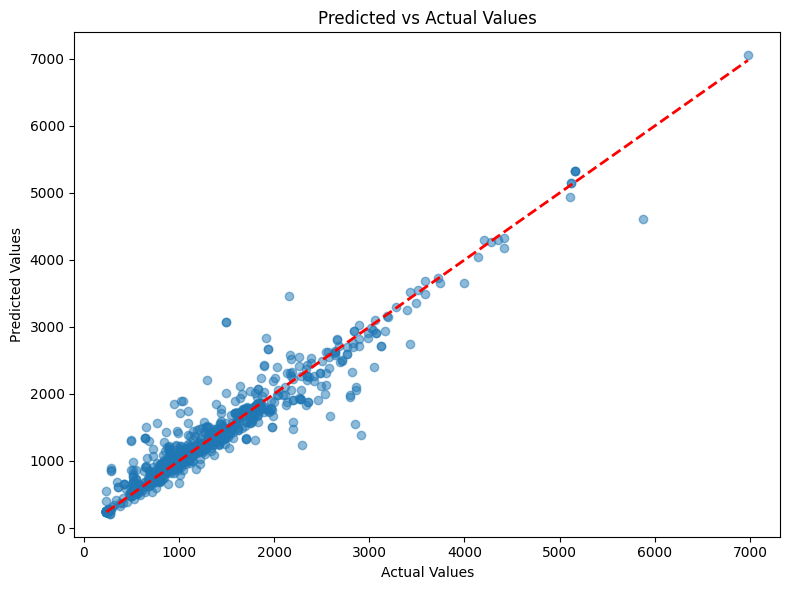

In [ ]:
## Error Analysis 
plot_predicted_vs_actual(simplified_model, X_test_np, y_test)

# Chosen Model (Weighted Ensemble Hybrid)

In [ ]:
print("Creating weighted ensemble of top models with feature handling...")
print("\nGenerating test predictions...")
# Get predictions directly from each model for test data
simplified_preds = simplified_model.predict(X_test_np)
hybrid_preds = hybrid_model.predict(X_test_np)  

# Combine predictions
ensemble_preds = np.column_stack([simplified_preds, hybrid_preds])

# Find optimal weights using a simple approach
print("\nFinding optimal weights...")
# Try different weight combinations and evaluate
best_rmse = float('inf')
best_weights = None
best_preds = None

for w1 in np.linspace(0, 1, 21):  # Try weights from 0 to 1 in 0.05 increments
    w2 = 1 - w1
    weights = np.array([w1, w2])
    
    # Weighted prediction
    weighted_preds = ensemble_preds.dot(weights)
    
    # Calculate RMSE
    rmse = math.sqrt(mean_squared_error(y_test_np, weighted_preds))
    
    # Track best weights
    if rmse < best_rmse:
        best_rmse = rmse
        best_weights = weights
        best_preds = weighted_preds

print(f"Best weights found: Simplified={best_weights[0]:.4f}, Hybrid={best_weights[1]:.4f}")
print(f"Best RMSE: {best_rmse:.4f}")

# Calculate other metrics
r2 = r2_score(y_test_np, best_preds)
mae = mean_absolute_error(y_test_np, best_preds)
mape = np.mean(np.abs((y_test_np - best_preds) / y_test_np))

print(f"\nWeighted Ensemble Performance:")
print(f"R²:   {r2:.4f}")
print(f"RMSE:  {best_rmse:.4f}")
print(f"MAE:   {mae:.4f}")
print(f"MAPE:  {mape:.4f}")

print("\nPerformance comparison:")
print("                          R²      RMSE     MAE      MAPE")
print(f"Simplified with Feature Selection: 0.9353   221.09   123.27   11.00%")
print(f"Weighted Ensemble:                 {r2:.4f}   {best_rmse:.2f}   {mae:.2f}   {mape:.2%}")

# Create final model class
class FinalEnsembleModel:
    def __init__(self, model1, model2, weights):
        self.model1 = model1
        self.model2 = model2
        self.weights = weights
    
    def predict(self, X):
        # Get predictions from each model
        preds1 = self.model1.predict(X)
        preds2 = self.model2.predict(X)
        
        # Apply weights
        ensemble_preds = self.weights[0] * preds1 + self.weights[1] * preds2
        
        return ensemble_preds

# Create the final model
final_model = FinalEnsembleModel(
    model1=simplified_model,
    model2=hybrid_model,
    weights=best_weights
)

print("\nFinal model created and ready for deployment")

Creating weighted ensemble of top models with feature handling...

Generating test predictions...
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011635 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further s

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW


Finding optimal weights...
Best weights found: Simplified=0.2000, Hybrid=0.8000
Best RMSE: 209.2259

Weighted Ensemble Performance:
R²:   0.9360
RMSE:  209.2259
MAE:   103.1306
MAPE:  0.0897

Performance comparison:
                          R²      RMSE     MAE      MAPE
Simplified with Feature Selection: 0.9353   221.09   123.27   11.00%
Weighted Ensemble:                 0.9360   209.23   103.13   8.97%

Final model created and ready for deployment


c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UW

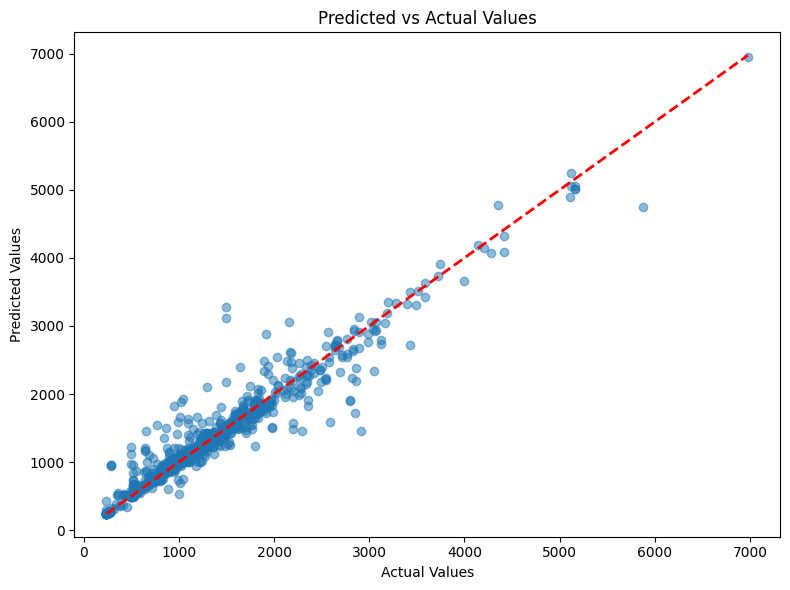

In [ ]:
## Error Analysis 
plot_predicted_vs_actual(final_model, X_test_np, y_test)

In [ ]:
# Extract the first instance from the test set
first_instance = X_test_np[0:1]  # Keep it as a 2D array with one row

# Get the actual value for comparison
actual_value = y_test.iloc[0] if hasattr(y_test, 'iloc') else y_test[0]

# Make prediction with the final model
predicted_value = final_model.predict(first_instance)[0]  # Get the first element of the prediction array

# Display the results
print(f"First test instance prediction:")
print(f"Actual value: £{actual_value:.2f}")
print(f"Predicted value: £{predicted_value:.2f}")
print(f"Difference: £{abs(actual_value - predicted_value):.2f}")
print(f"Percentage error: {abs(actual_value - predicted_value) / actual_value * 100:.2f}%")

# Get predictions from each component model
simplified_pred = final_model.model1.predict(first_instance)[0]
hybrid_pred = final_model.model2.predict(first_instance)[0]

print(f"\nComponent predictions:")
print(f"Simplified model: £{simplified_pred:.2f} (weight: {final_model.weights[0]:.2f})")
print(f"Hybrid model: £{hybrid_pred:.2f} (weight: {final_model.weights[1]:.2f})")
print(f"Weighted combination: £{final_model.weights[0] * simplified_pred + final_model.weights[1] * hybrid_pred:.2f}")

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.001710 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gai

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


First test instance prediction:
Actual value: £790.00
Predicted value: £802.70
Difference: £12.70
Percentage error: 1.61%
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000860 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1267
[LightGBM] [Info] Number of data points in the train set: 3812, number of used features: 31
[LightGBM] [Info] Start training from score 1216.705700
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(



Component predictions:
Simplified model: £861.00 (weight: 0.20)
Hybrid model: £788.60 (weight: 0.80)
Weighted combination: £803.08


c:\Users\Benjamin Khor\OneDrive - UWE Bristol\Credit-Scoring-System\.venv\Lib\site-packages\sklearn\utils\validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


# Model Serialization

In [ ]:
import joblib

joblib.dump(tuned_rf, 'rf.pkl')
joblib.dump(tuned_gbr, 'gbr.pkl')
joblib.dump(tuned_xgb, 'xgb_model.pkl')

joblib.dump(numerical_imputer, 'numerical_imputer.pkl')
joblib.dump(categorical_imputer, 'categorical_imputer.pkl')

joblib.dump(label_encoder, 'label_encoder.pkl')
joblib.dump(one_hot_encoder, 'onehot_encoder.pkl')
joblib.dump(target_encoder, 'target_encoder.pkl')

joblib.dump(scaler, 'standard_scaler.pkl')

# Save column names for consistency
preprocessing_metadata = {
    'numerical_columns': numerical_cols,
    'target_encoding_columns': target_encoding_cols,
    'onehot_encoding_columns': onehot_encoding_cols,
    'label_encoding_columns': label_encoding_cols,
    'feature_names': X_train.columns.tolist(),
}
joblib.dump(preprocessing_metadata, 'preprocessing_metadata.pkl')

joblib.dump(X_train, 'X_train.pkl')
joblib.dump(y_train, 'y_train.pkl')
joblib.dump(X_test, 'X_test.pkl')
joblib.dump(y_test, 'y_test.pkl')

['y_test.pkl']

In [481]:
# Save column names for consistency
preprocessing_metadata = {
    'numerical_columns': numerical_cols,
    'target_encoding_columns': target_encoding_cols,
    'onehot_encoding_columns': onehot_encoding_cols,
    'label_encoding_columns': label_encoding_cols,
    'feature_names': X_train.columns.tolist(),
}
joblib.dump(preprocessing_metadata, 'preprocessing_metadata.pkl')

['preprocessing_metadata.pkl']

In [460]:
X_train_unencoded, X_test_unencoded, y_train_unencoded, y_test_unencoded = train_test_split(insurance_data.drop('Settlement_Value', axis=1), insurance_data['Settlement_Value'], test_size=0.2, random_state=42)

In [ ]:
def compare_original_vs_encoded(X_unencoded, X_encoded, target_encoding_cols):
    for col in target_encoding_cols:
        print(f"\n{col} Encoding Mapping:")
        print(f"{'Original Value':<30} | {'Encoded Value':<15}")
        print("-" * 50)
        
        # Get all unique original values
        unique_orig_values = X_unencoded[col].unique()
        
        # For each unique original value, find its encoded value
        for orig_val in unique_orig_values:
            # Find rows in unencoded data with this value
            indices = X_unencoded[X_unencoded[col] == orig_val].index
            
            # Get the corresponding encoded value from the same row in encoded data
            # We use the first occurrence since all should have the same encoded value
            if len(indices) > 0:
                encoded_val = X_encoded.loc[indices[0], col]
                print(f"{str(orig_val):<30} | {encoded_val:<15.4f}")

# Call the function to compare
compare_original_vs_encoded(X_train_unencoded, X_train, target_encoding_cols)


Accident_Type Encoding Mapping:
Original Value                 | Encoded Value  
--------------------------------------------------
Other side changed lanes and collided with clt's vehicle | 1349.6307      
Other side pulled from parked position into the path of clt's vehicle | 1241.0428      
Rear end                       | 1134.4706      
Other side drove on wrong side of the road | 1461.9966      
Other side changed lanes on a roundabout colliding with clt's vehicle | 1256.6905      
Other side pulled out of side road | 1396.4024      
Other                          | 1354.6189      
Other side turned across Clt's path | 1391.3469      
Rear end - Clt pushed into next vehicle | 1352.1676      
Rear end - 3 car - Clt at front | 1089.9695      
Other side reversed into Clt's vehicle | 1041.0907      
Other side pulled on to roundabout | 1374.8878      
Other side reversed into clt's stationary vehicle | 855.6197       
Other side overtook and pulled in too soon | 1212.0400      
Oth

In [472]:
# print the unque values of the target encoding columns in insurance_data
print("\nUnique values in target encoding columns:")
for col in target_encoding_cols:
    print(f"\n{col} Unique Values:")
    print(X_train_unencoded[col].unique())


Unique values in target encoding columns:

Accident_Type Unique Values:
["Other side changed lanes and collided with clt's vehicle"
 "Other side pulled from parked position into the path of clt's vehicle"
 'Rear end' 'Other side drove on wrong side of the road'
 "Other side changed lanes on a roundabout colliding with clt's vehicle"
 'Other side pulled out of side road' 'Other'
 "Other side turned across Clt's path"
 'Rear end - Clt pushed into next vehicle'
 'Rear end - 3 car - Clt at front'
 "Other side reversed into Clt's vehicle"
 'Other side pulled on to roundabout' nan
 "Other side reversed into clt's stationary vehicle"
 'Other side overtook and pulled in too soon'
 "Other side collided with Clt's parked vehicle"
 "Other side opened their door, hitting clt's vehicle"
 'Other side overtook and hit Clt when pulling in']

Accident_Description Unique Values:
['Lost control on a snowy road.' 'Hit a deer on the highway.'
 'Rear-ended at a stoplight.' nan 'Swerved to avoid another veh

In [459]:
# print all the unique values in the target encoded columns in the train set
print("\nUnique values in target encoding columns in train set:")
for col in target_encoding_cols:
    print(f"\n{col} Unique Values:")
    print(X_train[col].unique())


Unique values in target encoding columns in train set:

Accident_Type Unique Values:
[1349.63068616 1241.04280158 1134.47061765 1461.99663178 1256.69048643
 1396.40243119 1354.61888059 1391.34687901 1352.16761143 1089.96954887
 1041.09071855 1374.88782351  855.61973351 1212.0399689   937.66305314
 1195.00909076 1245.44202904]

Accident_Description Unique Values:
[1208.47352034 1214.81734007 1193.91751295 1223.95441092 1243.86712162]

Injury_Description Unique Values:
[1229.49145125 1261.81193324 1171.8660026  1254.87989026 1164.74420168]

Dominant_Injury Unique Values:
[1232.93037675 1188.29227027 1221.55484615 1223.1913645 ]


In [478]:
# print the predicted values and the actual values of first row of test set for tuned_gbr model
tuned_gbr_y_pred = tuned_gbr.predict(X_test)

print("\nPredicted vs Actual for test set (ROW 1):")
print(f"Predicted: {tuned_gbr_y_pred[0]:.2f}")
print(f"Actual: {y_test.iloc[0]:.2f}")


Predicted vs Actual for test set (ROW 1):
Predicted: 828.42
Actual: 790.00


In [480]:
tuned_rf_y_pred = tuned_rf.predict(X_test)

print("\nPredicted vs Actual for test set (ROW 1):")
print(f"Predicted: {tuned_rf_y_pred[0]:.2f}")
print(f"Actual: {y_test.iloc[0]:.2f}")


Predicted vs Actual for test set (ROW 1):
Predicted: 802.11
Actual: 790.00


In [477]:
# print all the data values in the first row of the test set
print("\nTest set data (ROW 1):")
print(X_test_unencoded.iloc[0])


Test set data (ROW 1):
Accident_Type                                        Rear end
Injury_Prognosis                                          6.0
Special_Health_Expenses                                   0.0
Special_Overage                                           0.0
General_Rest                                              0.0
Special_Additional_Injury                                 0.0
Special_Earnings_Loss                                     0.0
Special_Usage_Loss                                        0.0
Special_Medications                                       0.0
Special_Asset_Damage                                      0.0
Special_Rehabilitation                                    0.0
Special_Fixes                                             0.0
General_Fixed                                           520.0
General_Uplift                                            0.0
Special_Loaner_Vehicle                                    0.0
Special_Trip_Costs                            

# (SIMPLIFIED) Weighted Ensemble Hybrid Model

In [516]:
class WeightedEnsembleHybridModel(BaseEstimator, RegressorMixin):
    
    def __init__(self, corr_threshold=0.05, rf_model=None, gbr_model=None, 
                 blending_model=None, error_model=None):
        self.corr_threshold = corr_threshold
        
        # Part 1: Base models (use provided tuned models or create defaults)
        self.rf_model = rf_model if rf_model is not None else RandomForestRegressor(
            n_estimators=200, max_depth=10, random_state=42)
        
        self.gbr_model = gbr_model if gbr_model is not None else GradientBoostingRegressor(
            learning_rate=0.05, n_estimators=200, random_state=42)
        
        # Blending model
        self.blending_model = blending_model if blending_model is not None else HuberRegressor(
            epsilon=1.35, alpha=0.0001)
        
        # Error correction model
        self.error_model = error_model if error_model is not None else GradientBoostingRegressor(
            n_estimators=100, max_depth=4, random_state=42)
        
        # Selected features
        self.selected_features = None
    
    def _select_features(self, X, y):
        """Select features with correlation above threshold"""
        n_features = X.shape[1]
        correlations = np.zeros(n_features)
        
        for i in range(n_features):
            correlations[i] = np.corrcoef(X[:, i], y)[0, 1]
        
        # Keep features with absolute correlation >= threshold
        self.selected_features = np.abs(correlations) >= self.corr_threshold
        print(f"Selected {np.sum(self.selected_features)} out of {n_features} features")
        
        return X[:, self.selected_features]
    
    def fit(self, X, y):
        """Fit the hybrid model to training data"""
        # Convert to numpy arrays if needed
        X_array = np.array(X) if not isinstance(X, np.ndarray) else X
        y_array = np.array(y) if not isinstance(y, np.ndarray) else y
        
        # 1. Feature selection
        X_selected = self._select_features(X_array, y_array)
        
        # 2. Train base models
        print("Training base models...")
        self.rf_model.fit(X_selected, y_array)
        self.gbr_model.fit(X_selected, y_array)
        
        # 3. Generate meta-features
        rf_preds = self.rf_model.predict(X_selected)
        gbr_preds = self.gbr_model.predict(X_selected)
        
        # 4. Create rich meta-features
        meta_features = np.column_stack([
            rf_preds,
            gbr_preds,
            rf_preds**2,  # Squared predictions for non-linear relationships
            gbr_preds**2,
            np.abs(rf_preds - gbr_preds)  # Model disagreement
        ])
        
        # 5. Train blending model
        print("Training blending model...")
        self.blending_model.fit(meta_features, y_array)
        
        # 6. Generate blended predictions
        blended_preds = self.blending_model.predict(meta_features)
        
        # 7. Calculate errors and train error correction model
        errors = y_array - blended_preds
        print("Training error correction model...")
        self.error_model.fit(X_selected, errors)
        
        return self
    
    def predict(self, X):
        """Generate predictions from the hybrid model"""
        # Convert to numpy arrays if needed
        X_array = np.array(X) if not isinstance(X, np.ndarray) else X
        
        # 1. Select features
        if self.selected_features is None:
            raise ValueError("Model not fitted. Call fit() before predict().")
        
        X_selected = X_array[:, self.selected_features]
        
        # 2. Generate base model predictions
        rf_preds = self.rf_model.predict(X_selected)
        gbr_preds = self.gbr_model.predict(X_selected)
        
        # 3. Create rich meta-features
        meta_features = np.column_stack([
            rf_preds,
            gbr_preds,
            rf_preds**2,
            gbr_preds**2,
            np.abs(rf_preds - gbr_preds)
        ])
        
        # 4. Apply blending model
        blended_preds = self.blending_model.predict(meta_features)
        
        # 5. Apply error correction
        error_corrections = self.error_model.predict(X_selected)
        
        # 6. Final predictions with error correction
        final_preds = blended_preds + error_corrections
        
        return final_preds

In [520]:
# Create the model with your tuned models
hybrid_model = WeightedEnsembleHybridModel(
    corr_threshold=0.05,
    rf_model=tuned_rf,
    gbr_model=tuned_gbr) 


# Train the model
hybrid_model.fit(X_train, y_train)

# Make predictions
predictions = hybrid_model.predict(X_test)

Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...


R^2:   0.9553
RMSE:  174.8351
MAE:   74.8206
MAPE:  0.0731


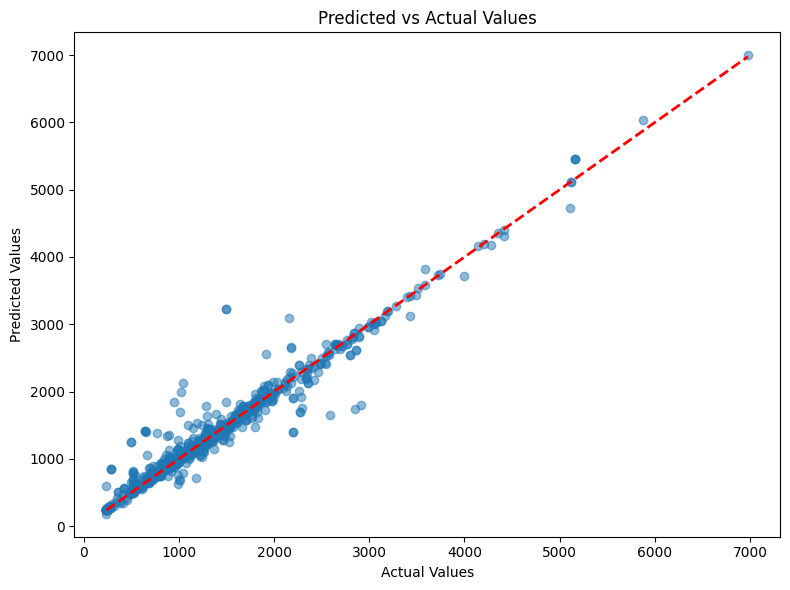

In [521]:
evaluate_model_performance(hybrid_model, X_test, y_test)
# Error Analysis
plot_predicted_vs_actual(hybrid_model, X_test, y_test)


In [487]:
# perform cross validation
run_cv(hybrid_model, X_train, y_train)

Selected 17 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 16 out of 39 features
Training base models...
Training blending model...
Training error correction model...
Selected 17 out of 39 features
Training base models...
Training 

{'r2_mean': 0.9231373404488284,
 'r2_std': 0.04882647372581032,
 'rmse_mean': 229.90304625082393,
 'rmse_std': 65.4547381334084,
 'mae_mean': 83.66340322549979,
 'mae_std': 9.855292104735327,
 'mape_mean': 0.07144609988983154,
 'mape_std': 0.010658011467104898}

In [526]:

print("\nPredicted vs Actual for test set (ROW 1):")
print(f"Predicted: {predictions[0]:.2f}")
print(f"Actual: {y_test.iloc[0]:.2f}")


Predicted vs Actual for test set (ROW 1):
Predicted: 814.94
Actual: 790.00


In [498]:
def verify_imputer_values(X_unencoded, numerical_cols, categorical_cols, 
                         numerical_imputer, categorical_imputer):
    """
    Check which columns had missing values and what values were imputed
    by comparing unencoded data with imputed values.
    """
    print("NUMERICAL IMPUTATION VERIFICATION")
    print("=================================")
    
    for col in numerical_cols:
        # Check if column exists in the unencoded data
        if col not in X_unencoded.columns:
            print(f"Column '{col}' not found in unencoded data")
            continue
            
        # Check if column had missing values
        missing_mask = X_unencoded[col].isnull()
        missing_count = missing_mask.sum()
        
        if missing_count > 0:
            # Get the imputation value (mean)
            imputed_value = X_unencoded[col].mean()
            
            print(f"\nColumn with missing values: {col}")
            print(f"Missing count: {missing_count}")
            print(f"Values imputed: {imputed_value:.4f} (mean)")
            
            # Show some examples of rows that were imputed
            missing_indices = X_unencoded[missing_mask].index[:5]  # Get first 5 indices
            if len(missing_indices) > 0:
                print("\nSample rows where values were imputed:")
                for idx in missing_indices:
                    print(f"  Row {idx}: NULL → {imputed_value:.4f}")
    
    print("\nCATEGORICAL IMPUTATION VERIFICATION")
    print("===================================")
    
    for col in categorical_cols:
        # Check if column exists in the unencoded data
        if col not in X_unencoded.columns:
            print(f"Column '{col}' not found in unencoded data")
            continue
            
        # Check if column had missing values
        missing_mask = X_unencoded[col].isnull()
        missing_count = missing_mask.sum()
        
        if missing_count > 0:
            # Get the imputation value (most frequent)
            imputed_value = X_unencoded[col].mode()[0]
            
            print(f"\nColumn with missing values: {col}")
            print(f"Missing count: {missing_count}")
            print(f"Values imputed: '{imputed_value}' (most frequent)")
            
            # Show some examples of rows that were imputed
            missing_indices = X_unencoded[missing_mask].index[:5]  # Get first 5 indices
            if len(missing_indices) > 0:
                print("\nSample rows where values were imputed:")
                for idx in missing_indices:
                    print(f"  Row {idx}: NULL → '{imputed_value}'")

# Run the verification
verify_imputer_values(
    X_train_unencoded, 
    numerical_cols, 
    categorical_cols,
    numerical_imputer, 
    categorical_imputer
)

NUMERICAL IMPUTATION VERIFICATION

Column with missing values: Injury_Prognosis
Missing count: 99
Values imputed: 6.0824 (mean)

Sample rows where values were imputed:
  Row 2580: NULL → 6.0824
  Row 2867: NULL → 6.0824
  Row 1391: NULL → 6.0824
  Row 356: NULL → 6.0824
  Row 1189: NULL → 6.0824

Column with missing values: Special_Health_Expenses
Missing count: 79
Values imputed: 3.0595 (mean)

Sample rows where values were imputed:
  Row 996: NULL → 3.0595
  Row 2787: NULL → 3.0595
  Row 3027: NULL → 3.0595
  Row 2784: NULL → 3.0595
  Row 4233: NULL → 3.0595

Column with missing values: Special_Overage
Missing count: 67
Values imputed: 13.8984 (mean)

Sample rows where values were imputed:
  Row 996: NULL → 13.8984
  Row 4377: NULL → 13.8984
  Row 2580: NULL → 13.8984
  Row 897: NULL → 13.8984
  Row 4233: NULL → 13.8984

Column with missing values: General_Rest
Missing count: 75
Values imputed: 459.1930 (mean)

Sample rows where values were imputed:
  Row 2157: NULL → 459.1930
  Row 